In [270]:
%load_ext autoreload
%autoreload 2
%config IPCompleter.use_jedi = False

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [662]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
from adjustText import adjust_text

from scipy.stats import ks_2samp, ttest_ind, pearsonr, chisquare
from statsmodels.stats.multitest import multipletests

import scvi
from scvi.model import CondSCVI, DestVI

import umap
import torch
from torch.distributions import Gamma
import gseapy
import hotspot

import base64
from io import BytesIO

from utils import *

%matplotlib inline

# import data and collide cell-types

In [492]:
sc_adata = sc.read_h5ad("scRNA-Tumor-compressed.h5ad")

In [493]:
sc_adata.obs["broad_labels"].value_counts()

Mon-Mac        4400
CD8            1021
CD4-Tregs       833
DCs             502
Neutrophils     186
NK              155
Tumor            88
Name: broad_labels, dtype: int64

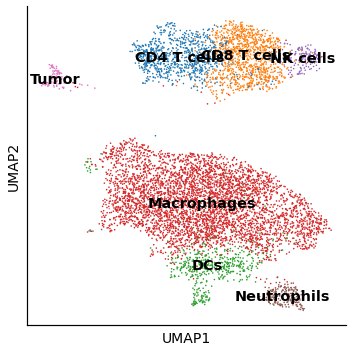

In [992]:
fig, ax = plt.subplots(figsize=(5, 5))
sc.pl.umap(
    sc_adata, 
    color="broad_labels_",
    frameon=True,
    title="",
    legend_loc="on data",
    legend_fontsize="x-large",
    ax=ax, size=10, show=False,
)
plt.tight_layout()
# plt.savefig("figures/UMAP_scRNA.pdf", dpi=DPI)

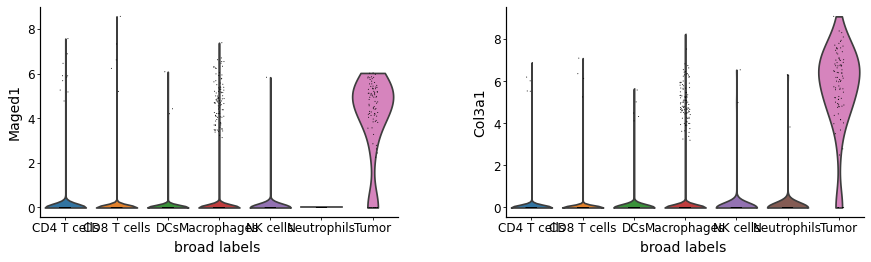

In [995]:
sc.pl.violin(sc_adata, ['Maged1', "Col3a1"], groupby='broad_labels_')

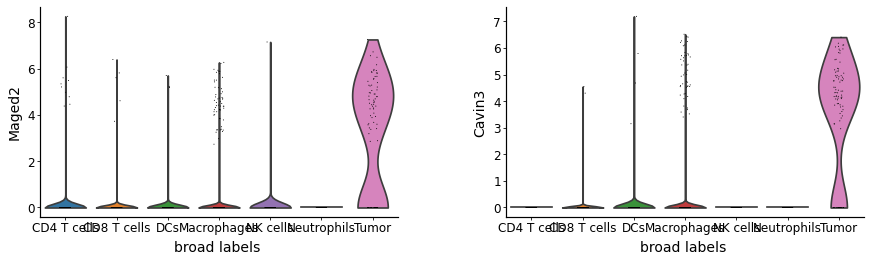

In [996]:
sc.pl.violin(sc_adata, ['Maged2', "Cavin3"], groupby='broad_labels_')

In [495]:
sc_adata.obs["broad_labels"].value_counts().sum()

7185

In [496]:
G = 4000
sc.pp.filter_genes(sc_adata, min_counts=10)

sc_adata.layers["counts"] = sc_adata.X.copy()

sc.pp.highly_variable_genes(
    sc_adata,
    n_top_genes=G,
    subset=True,
    layer="counts",
    flavor="seurat_v3"
)

sc.pp.normalize_total(sc_adata, target_sum=10e4)
sc.pp.log1p(sc_adata)
sc_adata.raw = sc_adata

/home/ubuntu/anaconda3/envs/scVI/lib/python3.7/site-packages/scanpy/preprocessing/_highly_variable_genes.py:144: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  df.loc[: int(n_top_genes), 'highly_variable'] = True


In [497]:
sc_adata

AnnData object with n_obs × n_vars = 7185 × 4000
    obs: 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'broad_labels', 'broad_labels_', 'ABfile', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden', 'leiden_2'
    var: 'n_counts', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: '_scvi', 'broad_labels_colors', 'leiden', 'leiden_2_colors', 'neighbors', 'umap', 'broad_labels__colors', 'hvg', 'log1p'
    obsm: 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

## get intersection with spatial

In [498]:
st_adata = sc.read_h5ad("ST-Tumor-compressed.h5ad")

In [502]:
# now modify coordinates to fit into a single image
coordinates = np.zeros(shape=(st_adata.n_obs, 2))
for b in ("0", "1"):
    mask = st_adata.obs["batch"] == b
    for ax, name in ([0, "x"], [1, "y"]):
        #data = adata[mask].obsm["spatial"][:, ax]
        data = st_adata[mask].obs[["array_col", "array_row"]].values[:, ax].astype(np.float)
        normalized_locations = data - data.min()
        
        if b == "0" and name == "x":
            normalized_locations -= 0
            normalized_locations *= 0.8
        if b == "0" and name == "y":
            normalized_locations *= -1
        if b == "1" and name == "y":
            normalized_locations -= 105
            normalized_locations *= 1
        coordinates[mask, ax] = normalized_locations
        print(b, name, data.min(), data.max())
        
    # rotation
    if b == "0":
        theta = -11 * np.pi/180
        r = np.array(( (np.cos(theta), -np.sin(theta)),
                   (np.sin(theta),  np.cos(theta)) ))
        coordinates[mask] = np.dot(coordinates[mask], r)

        
st_adata.obsm["location"] = coordinates

0 x 21.0 110.0
0 y 0.0 68.0
1 x 0.0 118.0
1 y 0.0 48.0


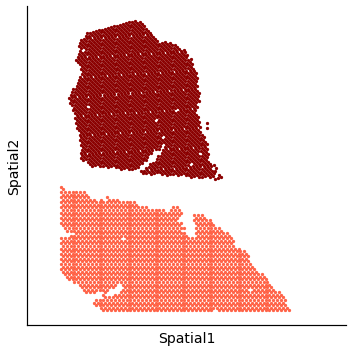

In [503]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
color_list = ["darkred", "tomato"]
name_list = ["Tumor-1", "Tumor-2"]
for i, value in enumerate(["A1", "B1"]):
    mask = st_adata.obs["tumor"] == value
    ax.scatter(st_adata.obsm["location"][mask, 0], st_adata.obsm["location"][mask, 1], 
               c=color_list[i], label=name_list[i], s=5)
    
ax.scatter([-10, 140], [0, 0], s=0)
# ax.legend(frameon=True)
prettify_axis(ax, False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel("Spatial1")
ax.set_ylabel("Spatial2")
plt.tight_layout()
plt.savefig("figures/spatial.pdf", dpi=DPI)

In [504]:
st_adata.obs["tumor"].value_counts(), st_adata.n_obs

(A1    2125
 B1    1902
 Name: tumor, dtype: int64,
 4027)

In [505]:
# filter genes to be the same on the spatial data
intersect = np.intersect1d(sc_adata.var_names, st_adata.var_names)
st_adata = st_adata[:, intersect].copy()
sc_adata = sc_adata[:, intersect].copy()

In [506]:
G = len(intersect)
print(G)

2886


In [507]:
st_adata.layers["counts"] = st_adata.X.copy()

sc.pp.normalize_total(st_adata, target_sum=10e4)
sc.pp.log1p(st_adata)
st_adata.raw = st_adata

(35004.0, 14822.169921875)

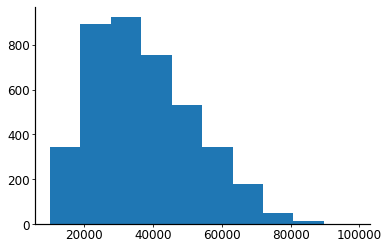

In [508]:
plt.hist(st_adata.obs["total_counts"])
st_adata.obs["total_counts"].median(), st_adata.obs["total_counts"].std()

(3469.0, 4672.2158203125)

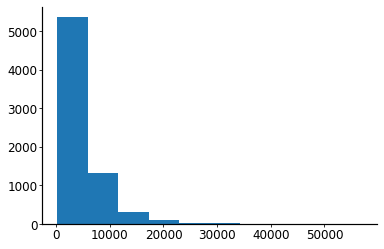

In [509]:
plt.hist(sc_adata.obs["total_counts"])
sc_adata.obs["total_counts"].median(), sc_adata.obs["total_counts"].std()

## fit scRNA-seq model

In [510]:
scvi.data.setup_anndata(sc_adata, layer="counts", labels_key="broad_labels")

INFO     No batch_key inputted, assuming all cells are same batch                            
INFO     Using labels from adata.obs["broad_labels"]                                         
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 7185 cells, 2886 vars, 1 batches, 
         7 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


/home/ubuntu/anaconda3/envs/scVI/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [511]:
train = False
if train:
    # train the conditional VAE
    sc_model = CondSCVI(sc_adata)
    sc_model.train(max_epochs=350)
    sc_model.history["elbo_train"].plot()
    sc_model.save("sc_model", overwrite=True)
else:
    sc_model = CondSCVI.load("CondSCVI", sc_adata, use_gpu=True)

INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Registered keys:['X', 'batch_indices', 'local_l_mean', 'local_l_var', 'labels']     
INFO     Successfully registered anndata object containing 7185 cells, 2886 vars, 1 batches, 
         7 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              


/home/ubuntu/anaconda3/envs/scVI/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [512]:
sc_adata.obsm["X_CondSCVI"] = sc_model.get_latent_representation()

## Deconvolution

In [513]:
# get dataset ready
scvi.data.setup_anndata(st_adata, layer="counts")

INFO     No batch_key inputted, assuming all cells are same batch                            
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 4027 cells, 2886 vars, 1 batches, 
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


/home/ubuntu/anaconda3/envs/scVI/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [514]:
# add here number of cell type
train_st = False
if train_st:
    st_model = DestVI.from_rna_model(st_adata, sc_model)
    st_model.train(max_epochs=2500)
    st_model.history["elbo_train"].plot()
    st_model.save("st_model", overwrite=True)
else:
    st_model = DestVI.load("st_model", st_adata)

INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Registered keys:['X', 'batch_indices', 'local_l_mean', 'local_l_var', 'labels',     
         'ind_x']                                                                            
INFO     Successfully registered anndata object containing 4027 cells, 2886 vars, 1 batches, 
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              


/home/ubuntu/anaconda3/envs/scVI/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [515]:
st_adata.obsm["proportions"] = st_model.get_proportions()
gamma = st_model.get_gamma(return_numpy=True)

## Statistics on proportions

In [700]:
loc = pd.DataFrame(data=st_adata.obsm["location"], index=st_adata.obs.index)
hs = hotspot.Hotspot(st_adata.obsm["proportions"].T, model='none', latent=loc,)

hs.create_knn_graph(
    weighted_graph=True, n_neighbors=50,
)

hs_results = hs.compute_autocorrelations(jobs=1)

hs_results

100%|██████████| 7/7 [00:00<00:00, 2603.77it/s]


,C,Z,Pval,FDR
Gene,,,,
Mon-Mac,0.966780,52.832022,0.000000e+00,0.000000e+00
Tumor,0.973098,33.099684,1.501551e-240,5.255429e-240
DCs,0.791329,4.170098,1.522344e-05,3.552137e-05
Neutrophils,0.781613,0.521140,3.011346e-01,4.787066e-01
CD4-Tregs,0.466505,0.167201,4.336059e-01,4.787066e-01
CD8,0.495186,0.135837,4.459752e-01,4.787066e-01
NK,0.562887,0.053400,4.787066e-01,4.787066e-01


In [ ]:
axes[0].barh(np.arange(bar_data.shape[0]), bar_data["C"].values, color=sns.color_palette("tab20")[0:bar_data.shape[0]][::-1])
axes[0].set_yticks(np.arange(bar_data.shape[0]))
axes[0].set_yticklabels( bar_data.index.values)
axes[0].set_xlabel("Spatial Autocorrelation")

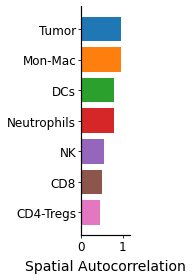

In [710]:
fig, ax = plt.subplots(1, 1, figsize=(2, 4))
ax.margins(x=0.2)
bar_data = hs_results.sort_values("C", ascending=True)
ax.barh(np.arange(bar_data.shape[0]), bar_data["C"].values, 
                            color=sns.color_palette()[0:bar_data.shape[0]][::-1])
ax.set_yticks(np.arange(bar_data.shape[0]))
ax.set_yticklabels( bar_data.index.values)
ax.set_xlabel("Spatial Autocorrelation")
# ax.tick_params(axis='y', pad=-15)
plt.tight_layout()
plt.savefig("figures/geary.pdf", dpi=300)

/home/ubuntu/anaconda3/envs/scVI/lib/python3.7/site-packages/ipykernel/__main__.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


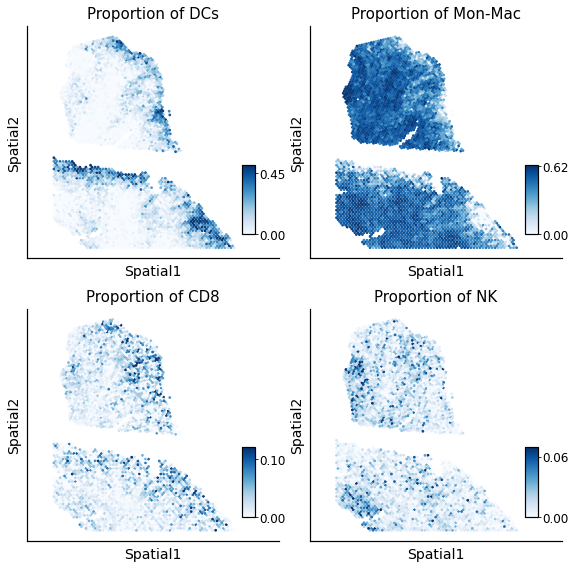

In [522]:
fig, axes = plt.subplots(2, 2, figsize=(8, 8))
ct_list = ["DCs", "Mon-Mac", "CD8", "NK"]
for i in range(2):
    for j in range(2):           
        prettify_axis(axes[i, j], False)
        data = st_adata.obsm["proportions"][ct_list[i*2 + j]]
        vmax = np.quantile(data, 0.99)
        axes[i, j].scatter([-10, 140], [0, 0], s=0)
        scplot = axes[i, j].scatter(st_adata.obsm["location"][:, 0], st_adata.obsm["location"][:, 1], 
                c=data, s=3, cmap="Blues", vmax=vmax)
        a, b = np.quantile(data, 0.01),np.quantile(data, 0.98)
        ta, tb = ["{:0.2f}".format(x) for x in (a, b)]
        cax = inset_axes(axes[i, j], width="5%", height="30%", loc=4, borderpad=2) 
        cbar = plt.colorbar(scplot, cax=cax, orientation="vertical")
        cbar.set_ticks([a, b])
        cbar.set_ticklabels([ta, tb])
        axes[i, j].set_title(F"Proportion of {ct_list[i*2+j]}")
        axes[i, j].set_xticks([])
        axes[i, j].set_yticks([])
        axes[i, j].set_xlabel("Spatial1")
        axes[i, j].set_ylabel("Spatial2")
plt.tight_layout()
plt.savefig("figures/proportions.pdf", dpi=DPI)

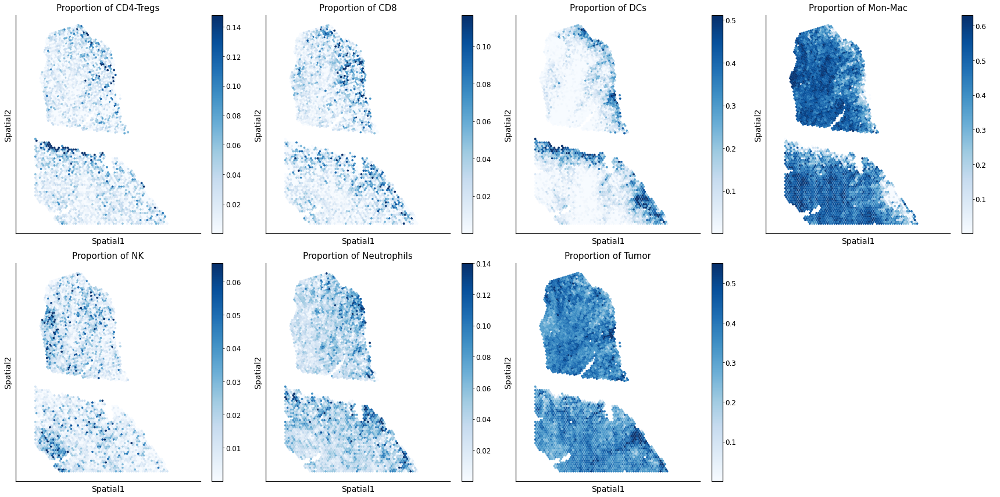

In [523]:
# all cell types for supplements
# selected cell type for paper
fig, axes = plt.subplots(2, 4, figsize=(24, 12))
ct_list = st_adata.obsm["proportions"].columns
for i in range(2):
    for j in range(4):
        if i*4 + j < 7:
            prettify_axis(axes[i, j], False)
            data = st_adata.obsm["proportions"][ct_list[i*4 + j]]
            vmax = np.quantile(data, 0.99)
            scplot = axes[i, j].scatter(st_adata.obsm["location"][:, 0], st_adata.obsm["location"][:, 1], 
                c=data, s=8, cmap="Blues", vmax=vmax)
            plt.colorbar(scplot, ax=axes[i, j])
            axes[i, j].set_title(F"Proportion of {ct_list[i*4+j]}")
            axes[i, j].set_xticks([])
            axes[i, j].set_yticks([])
            axes[i, j].set_xlabel("Spatial1")
            axes[i, j].set_ylabel("Spatial2")
            axes[i, j].scatter([-10, 140], [0, 0], s=0)

        else:
            prettify_axis(axes[i, j], True)

plt.tight_layout()
# plt.savefig("figures/proportions_supp.pdf", dpi=DPI)

##  Show proportion for every cell type spatially and find characteristic proportions

100%|██████████| 100/100 [00:00<00:00, 8478.14it/s]


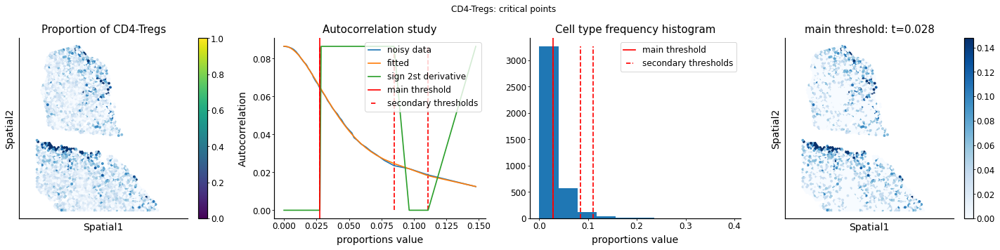

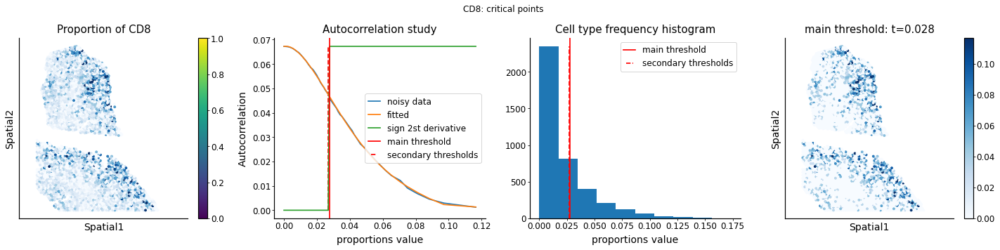

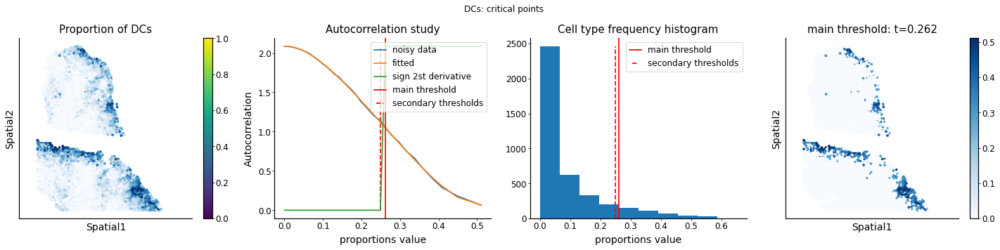

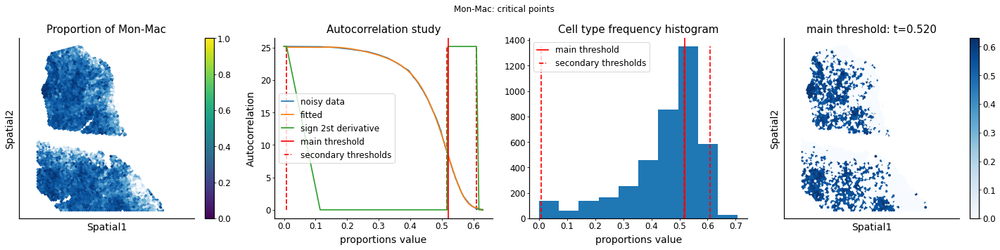

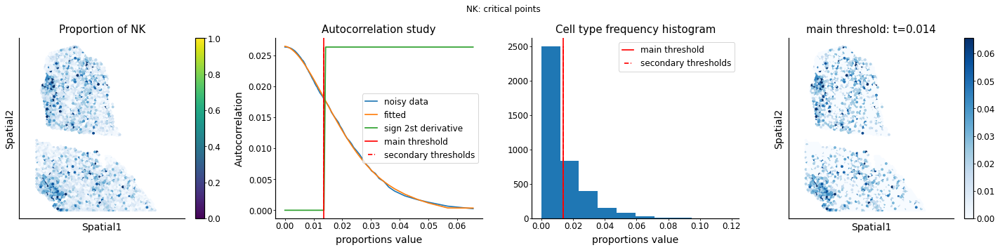

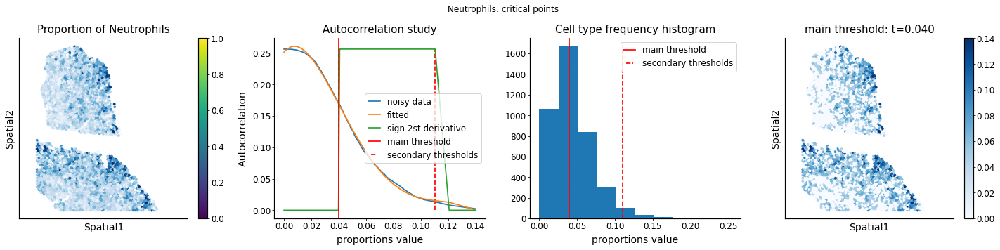

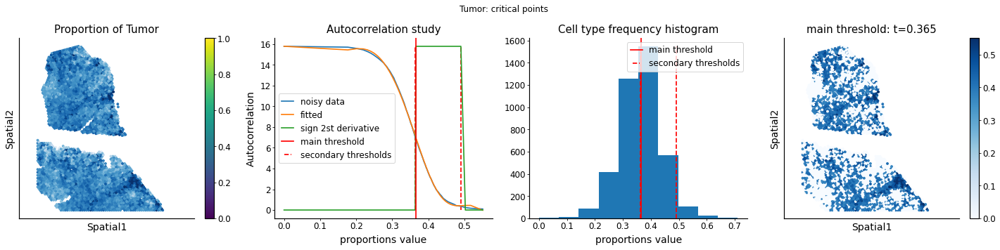

In [525]:
ct_thresholds = {}
nominal_threshold = {}

html = "<h2>Automatic thresholding</h2>"

for name_ct in ct_list:
    # show proportions
#     html += f"<h2>{name_ct} ANALYSIS:</h2>"
    array = st_adata.obsm["proportions"][name_ct]
    
    fig = plt.figure(figsize=(20, 5))
    fig.suptitle(name_ct+": critical points")
    ax1 = plt.subplot(141)
    prettify_axis(ax1, False)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel("Spatial1")
    plt.ylabel("Spatial2")
    vmax = np.quantile(array.values, 0.99)
    plt.scatter(st_adata.obsm["location"][:, 0], st_adata.obsm["location"][:, 1], 
            c=array, s=8, cmap="Blues", vmax=vmax)
    plt.scatter([-10, 140], [0, 0], s=0)
    plt.colorbar()
    plt.title("Proportion of "+name_ct)

    # get characteristic values
    quantiles, stack = form_stacked_quantiles(array.values)
    index, z_values = get_autocorrelations(st_adata, stack, quantiles)
    z_values, smoothed, derivative, sign_2nd, _ = smooth_get_critical_points(index, z_values, s=0.1)

    #plot characteristic plots
    ymax = np.max(z_values)
    ax2 = plt.subplot(142)
    prettify_axis(ax2)
    plt.plot(index, z_values, label="noisy data")
    plt.plot(index, smoothed, label="fitted")
    plt.plot(index, ymax * sign_2nd, label="sign 2st derivative")
    # identify points
    ipoints = index[np.where(sign_2nd[:-1] != sign_2nd[1:])[0]]
    plt.vlines(ipoints, ymin=0, ymax=np.max(z_values), color="red", linestyle="--", label="secondary thresholds")
    # nominal mapping
    nom_map = index[np.argmin(derivative)]
    plt.axvline(nom_map, c="red", label="main threshold")
    plt.ylabel("Autocorrelation")
    plt.xlabel("proportions value")
    plt.title("Autocorrelation study")
    plt.legend()
    
    # plot on top of histogram
    ax3 = plt.subplot(143)
    prettify_axis(ax3)
    n, bins, patches = plt.hist(array.values)
    plt.vlines(ipoints, ymin=0, ymax=np.max(n), color="red", linestyle="--", label="secondary thresholds")
    # nominal mapping
    plt.axvline(nom_map, c="red", label="main threshold")
    plt.xlabel("proportions value")
    plt.title("Cell type frequency histogram")
    plt.legend()
    
    # add thresholds to dict
    nominal_threshold[name_ct] = nom_map
    ct_thresholds[name_ct] = ipoints
    
    ax4 = plt.subplot(144)
    prettify_axis(ax4, False)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel("Spatial1")
    plt.ylabel("Spatial2")    # show binarization for every ipoint
    p = nom_map
    vmax = np.quantile(array.values, 0.99)
    plt.scatter([-10, 140], [0, 0], s=0)
    plt.scatter(st_adata.obsm["location"][:, 0], st_adata.obsm["location"][:, 1], 
                c=array.values * (array.values > p), s=8, cmap="Blues", vmax=vmax)
    plt.title("main threshold: t={:0.3f}".format(p))
    plt.colorbar()
    plt.tight_layout()
    
    # DUMP TO HTML
    tmpfile = BytesIO()
    plt.savefig(tmpfile, format='png')
    encoded = base64.b64encode(tmpfile.getvalue()).decode('utf-8')
    html += '<img src=\'data:image/png;base64,{}\'>'.format(encoded)

# write HTML
with open('thresholding.html','w') as f:
    f.write(html)

### Now, for every cell type, we wish to explore the gamma space


/home/ubuntu/anaconda3/lib/python3.7/site-packages/cmap2d/util.py:32: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  bary_coords = la.lstsq(self._a,b)[0]
/home/ubuntu/destVI-paper-code/tumor/deconvolution/utils.py:137: RuntimeWarning: invalid value encountered in true_divide
  r = r_num/r_den


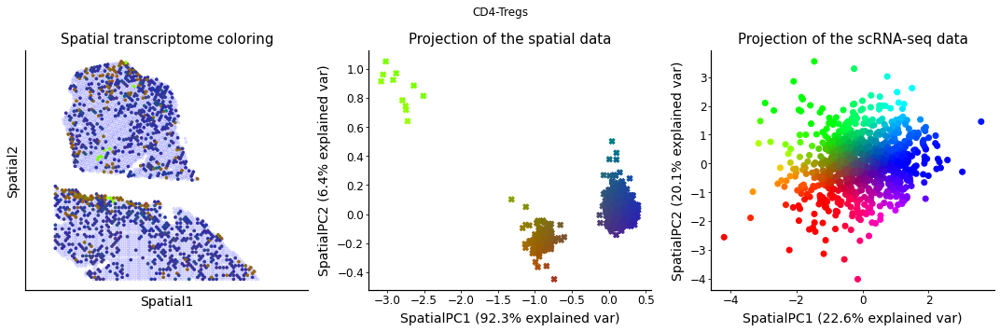

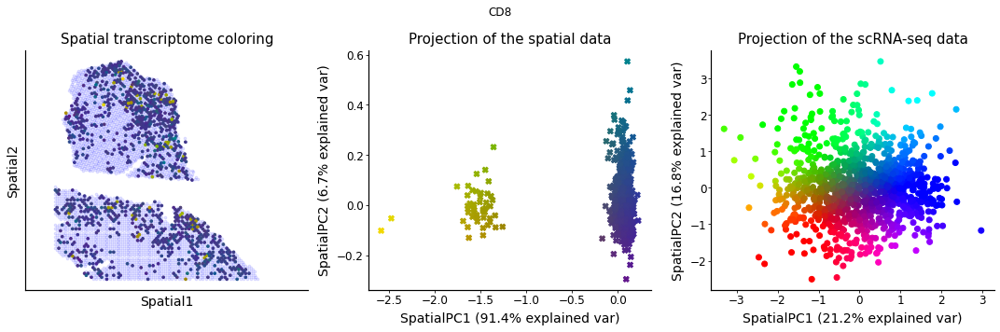

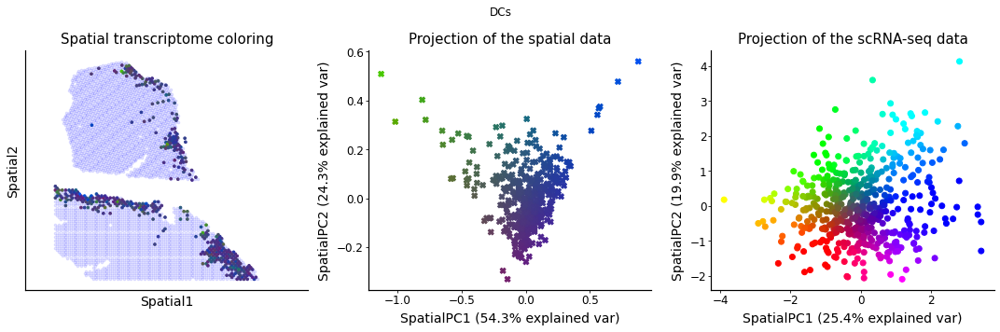

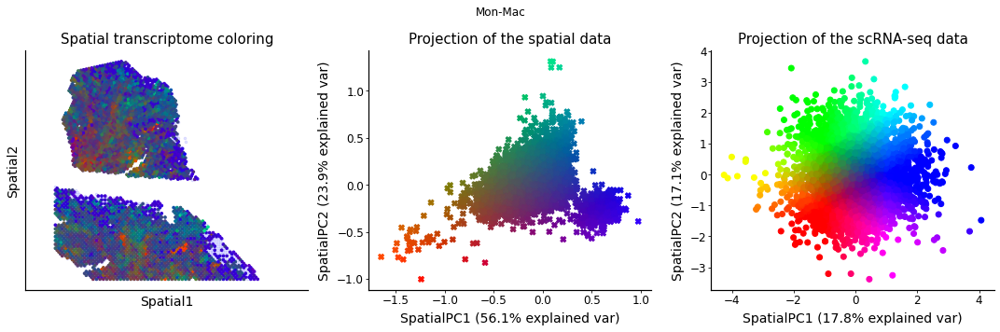

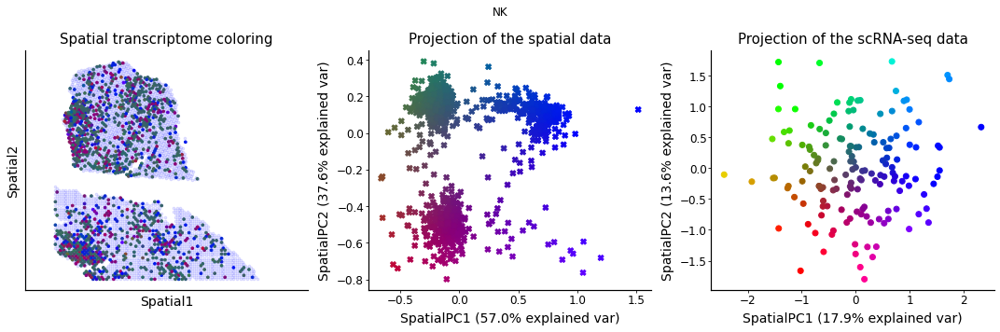

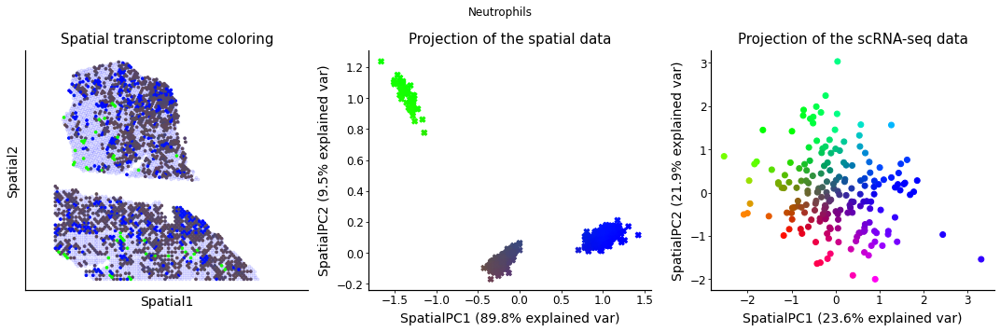

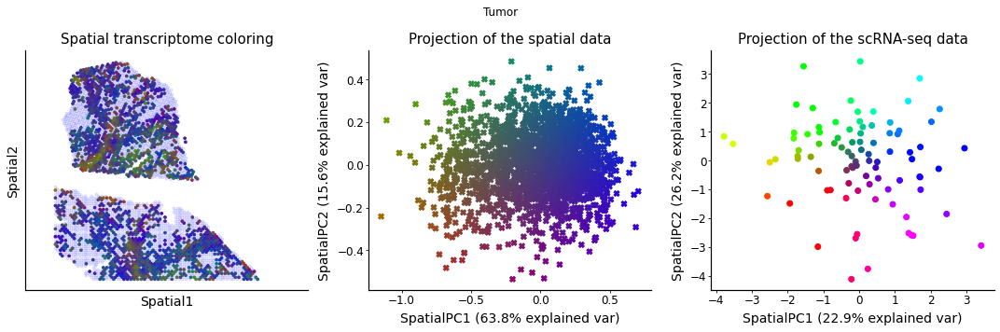

In [537]:
html = "<h1>sPCA analysis</h1>"

for name_ct in ct_list:
    # show proportions
#     html += f"<h3>{name_ct} ANALYSIS:</h2>"
    # find the components
    filter_ = st_adata.obsm["proportions"][name_ct].values > ct_thresholds[name_ct][0]
    locations = st_adata.obsm["location"][filter_]
    proportions = st_adata.obsm["proportions"][name_ct].values[filter_]
    ct_index = np.where(name_ct == st_model.cell_type_mapping)[0][0]
    data = gamma[:, :, ct_index][filter_]
    vec = get_spatial_components(locations, proportions, data)
    # project data onto them
    projection = np.dot(data - np.mean(data, 0), vec)

    # create the colormap
    cmap = cmap2d.TernaryColorMap(tri_coords, tri_colors)

    # apply colormap to spatial data
    color = np.vstack([cmap(projection[i]) for i in range(projection.shape[0])])
    
    fig = plt.figure(figsize=(15, 5))
    fig.suptitle(name_ct)
    ax1 = plt.subplot(132)
    prettify_axis(ax1)
    plt.scatter(projection[:, 0], projection[:, 1],c=color, marker="X")
    # variance and explained variance
    total_var = np.sum(np.diag(np.cov(data.T)))
    explained_var = 100 * np.diag(np.cov(projection.T)) / total_var 
    plt.xlabel("SpatialPC1 ({:.1f}% explained var)".format(explained_var[0]))
    plt.ylabel("SpatialPC2 ({:.1f}% explained var)".format(explained_var[1]))
    plt.title("Projection of the spatial data")

    ax3 = plt.subplot(131)
    prettify_axis(ax3, False)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel("Spatial1")
    plt.ylabel("Spatial2")
    plt.scatter([-10, 140], [0, 0], s=0)
    plt.scatter(st_adata.obsm["location"][:, 0], st_adata.obsm["location"][:, 1], alpha=0.1, s=7, c="blue")
    plt.scatter(st_adata.obsm["location"][filter_, 0], st_adata.obsm["location"][filter_, 1], 
                c=color, s=7)
    plt.title("Spatial transcriptome coloring")

    # go back to the single-cell data and find gene correlated with the axis
    sc_adata_slice = sc_adata[sc_adata.obs["broad_labels"] == name_ct]
    normalized_counts = sc_adata_slice.X.A
    sc_latent = sc_adata_slice.obsm["X_CondSCVI"]
    sc_projection = np.dot(sc_latent - np.mean(sc_latent,0), vec)

    # show the colormap for single-cell data
    color = np.vstack([cmap(sc_projection[i]) for i in range(sc_projection.shape[0])])
    ax2 = plt.subplot(133)
    prettify_axis(ax2)
    plt.scatter(sc_projection[:, 0], sc_projection[:, 1],c=color)
    # variance and explained variance
    total_var = np.sum(np.diag(np.cov(sc_latent.T)))
    explained_var = 100 * np.diag(np.cov(sc_projection.T)) / total_var 
    plt.xlabel("SpatialPC1 ({:.1f}% explained var)".format(explained_var[0]))
    plt.ylabel("SpatialPC2 ({:.1f}% explained var)".format(explained_var[1]))
    plt.title("Projection of the scRNA-seq data")
    plt.tight_layout()

    # DUMP TO HTML
    tmpfile = BytesIO()
    plt.savefig(tmpfile, format='png')
    encoded = base64.b64encode(tmpfile.getvalue()).decode('utf-8')
    html += '<img src=\'data:image/png;base64,{}\'>'.format(encoded)
    
    # calculate correlations, and for each axis:
    # (A) display top 50 genes + AND - (B) for each gene set, get GSEA 
    for d in [0, 1]:
        html += f"<h4>Genes associated with SpatialPC{d+1}</h4>"
        r = vcorrcoef(normalized_counts.T, sc_projection[:, d])
        for mode in ["Positively", "Negatively"]:
            ranking = np.argsort(r)
            if mode == "Positively":
                ranking = ranking[::-1]
            gl = list(st_adata.var.index[ranking[:50]])
            enr = gseapy.enrichr(gene_list=gl, description='pathway', 
                                 gene_sets='BioPlanet_2019', outdir='test', no_plot=True)
            html += f"<h5> {mode} </h5>"
            html += "<p>" + ", ".join(gl) + "</p>"
            text_signatures = enr.results.head(10)["Term"].values
            for i in range(10):
                if enr.results.iloc[i]["Adjusted P-value"] < 0.01:
                    text_signatures[i] += "*"
            
            html += "<p>" + ", ".join(text_signatures) + "</p>"            
# write HTML
with open('sPCA.html','w') as f:
    f.write(html)

### Last piece of automated analysis, look for Hotspot modules in the imputed values

In [40]:
# html = "<h1>Hotspot analysis</h1>"
# for name_ct in ct_list:
#     # show proportions
#     html += f"<h5>{name_ct} ANALYSIS:</h5>"

#     # get data
#     filter_ = st_adata.obsm["proportions"][name_ct].values > ct_thresholds[name_ct][0]
#     locations = st_adata.obsm["location"][filter_]
#     proportions = st_adata.obsm["proportions"][name_ct].values[filter_]

#     # impute
#     imp_ge = st_model.get_scale_for_ct(name_ct, indices=np.where(filter_)[0]).values

#     # run hotspot
#     loc = pd.DataFrame(data=locations, index=st_adata.obs.index[filter_])
#     df = pd.DataFrame(data=imp_ge.T, 
#                       columns=st_adata.obs.index[filter_], index=st_adata.var.index)
#     # run hotspot
#     hs = hotspot.Hotspot(df, model='none', latent=loc,)
#     hs.create_knn_graph(
#             weighted_graph=True, n_neighbors=5,
#         )
#     hs_results = hs.compute_autocorrelations(jobs=1)

#     gl = list(hs_results.index[:50])
#     enr = gseapy.enrichr(gene_list=gl, description='pathway', gene_sets='BioPlanet_2019', outdir='test', no_plot=True)

#     # dump HTML
#     html += "<p>" + ", ".join(gl) + "</p>"
#     html += "<p>" + ", ".join(enr.results.head(10)["Term"].values) + "</p>"
    
# # write HTML
# with open('hotspot.html','w') as f:
#     f.write(html)

100%|██████████| 2886/2886 [00:00<00:00, 12049.60it/s]


## then, quick API for plotting genes in a given cell type

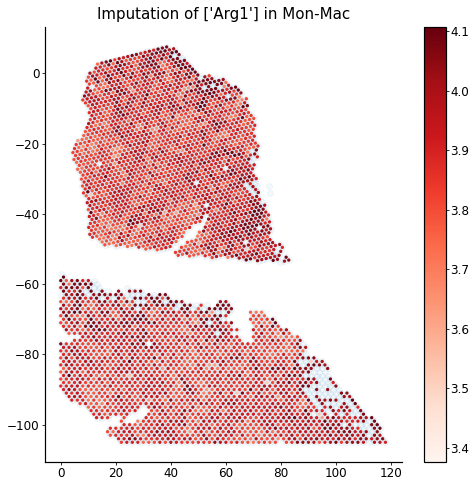

In [712]:
plt.figure(figsize=(8, 8))

name_ct = "Mon-Mac"
# gene_name = ["Hmox1", "Hilpda", "Gpnmb"]
gene_name=["Arg1"]


# get data
filter_ = st_adata.obsm["proportions"][name_ct].values > ct_thresholds[name_ct][0]
locations = st_adata.obsm["location"][filter_]
proportions = st_adata.obsm["proportions"][name_ct].values[filter_]

# impute
imp_ge = np.sum(st_model.get_scale_for_ct(name_ct, indices=np.where(filter_)[0])[gene_name].values, 1)
imp_ge = np.log(1 + 1e5 * imp_ge)
vmax = np.quantile(imp_ge, 0.99)
# plot
plt.scatter(st_adata.obsm["location"][:, 0], st_adata.obsm["location"][:, 1], alpha=0.05)
plt.scatter(locations[:, 0], locations[:, 1], 
            c=imp_ge, s=5, cmap="Reds", vmax=vmax)
plt.colorbar()
plt.title(f"Imputation of {gene_name} in {name_ct}")
plt.show()

# Refined analysis of macrophages

In [76]:
# Step 1, run hotpost and check the modules
# Step 2, check those modules on the single-cell data
# Step 3, do a molecular signature analysis of the hypoxic zone vs the rest

In [688]:
# run hotspot
name_ct = "Macrophages"
sc_adata_slice = sc_adata[sc_adata.obs["broad_labels_"] == name_ct]
loc = pd.DataFrame(data=sc_adata_slice.obsm["X_CondSCVI"], index=sc_adata_slice.obs.index)
df = pd.DataFrame(data=sc_adata_slice.X.A.T, columns=sc_adata_slice.obs.index, index=sc_adata_slice.var.index)
# run hotspot
hs = hotspot.Hotspot(df, model='danb', latent=loc,)
hs.create_knn_graph(
        weighted_graph=True, n_neighbors=15,
    )
hs_results = hs.compute_autocorrelations(jobs=1)

  0%|          | 0/2817 [00:00<?, ?it/s]


Removing 69 undetected/non-varying genes


100%|██████████| 2817/2817 [00:00<00:00, 3444.79it/s]


In [187]:
hs_genes = hs_results.index[hs_results["FDR"] < 0.05]
hs_genes

Index(['Gm42418', 'Gm26917', 'Hp', 'Lyz2', 'H2-Aa', 'Plac8', 'H2-Eb1', 'Ifit3',
       'Cd74', 'Rsad2',
       ...
       'Cdc34', 'Mrpl55', 'Arl4a', 'Ldlrad4', 'Huwe1', 'Nt5c3b', 'Prdx4',
       'Pmvk', 'Prss27', 'Zfp579'],
      dtype='object', name='Gene', length=994)

In [188]:
local_correlations = hs.compute_local_correlations(hs_genes, jobs=4)

 44%|████▍     | 435/994 [00:00<00:00, 4341.24it/s]

Computing pair-wise local correlation on 994 features...


100%|██████████| 493521/493521 [02:04<00:00, 3979.65it/s]


In [206]:
modules = hs.create_modules(
    min_gene_threshold=30, core_only=True, fdr_threshold=0.5
)

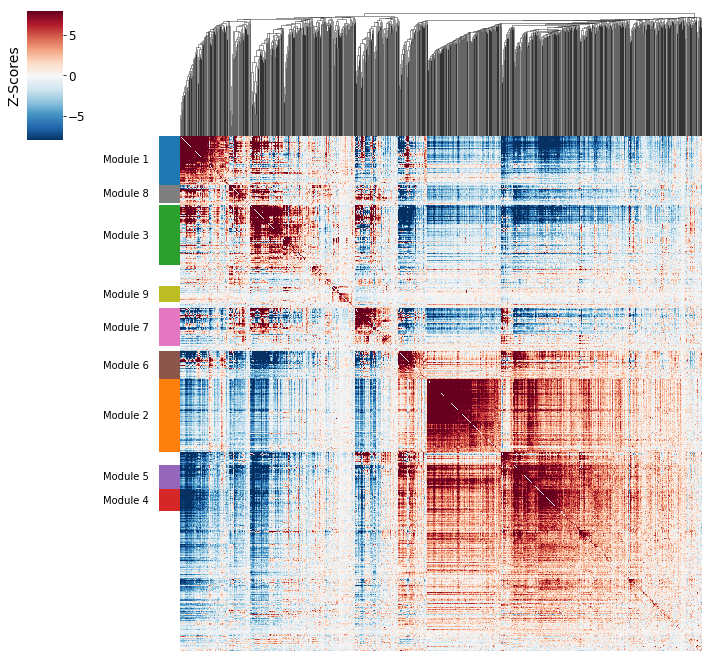

In [207]:
hs.plot_local_correlations()

In [214]:
for module in range(1, 8):
    print(f"Module {module}:")
    gl = list(hs.results.loc[hs.modules.index[np.where(hs.modules == module)[0]]].index[:50])
    print(", ".join(gl) + "\n")
    enr = gseapy.enrichr(gene_list=gl, description='pathway', gene_sets='BioPlanet_2019', outdir='test', no_plot=True)
    print(", ".join(enr.results.head(10)["Term"].values) + "\n")

Module 1:
Ifit3, Rsad2, Ifit2, Cxcl10, Ifit1bl1, Ifit1, Ly6a, Gbp2, Slfn5, Cmpk2, Ifi205, Ifit3b, Slfn4, Usp18, Isg20, Oasl1, Ifi208, AW112010, Mxd1, Irgm1, Samd9l, Socs1, Phf11d, Igtp, Ifih1, Ly6i, Pnp, Gbp5, Slfn9, Acod1, Cd69, Slamf7, Iigp1, Bst2, Tlr9, Ccl5, Scimp, Cd40, Il18bp, Flt1, Klrk1, Ccl4, Rilpl1, Sectm1a, Gm4951, Lipg, Ifi44, Gm13822, Tnfsf8, Ifi214

Interferon alpha/beta signaling, Interferon signaling, Immune system signaling by interferons, interleukins, prolactin, and growth hormones, TNF-alpha effects on cytokine activity, cell motility, and apoptosis, Toll-like receptor signaling pathway regulation, Immune system, Cytokine-cytokine receptor interaction, Type II interferon signaling (interferon-gamma), Malaria, Binding of chemokines to chemokine receptors

Module 2:
Birc5, Cdca3, Mki67, Stmn1, Cdca8, Nusap1, Ccnb2, Cks1b, Cenpe, Ccna2, Knstrn, Ckap2l, Ube2c, Plk1, Ccnb1, Cenpf, Cenpa, Top2a, Asf1b, Anln, Tpx2, Kif20b, Kif11, Smc2, Cdk1, Prc1, Hmmr, Tacc3, Kif20a, Tk1,

In [689]:
# Modules of interest
# ------ Arg1-
# ---------- MHC-II Module 7 
gene_mhc = ["H2-Aa", "H2-Eb1", "Cd74", "H2-Ab1", "H2-DMb1"]
# ---------- Monocytes markers Module 3
gene_mono = ["Ly6c2", "Plac8", "Ly6a", "Ace", "Ear2"]
# ---------- INF I Module 1
gene_ifn = ["Ifit1", "Ifit2", "Ifit3", "Usp18"]
# ------ Arg1+
# ---------- Hypoxia Module 5 / Mreg 
gene_hypox = ["Arg1", "Hmox1", "Hilpda", "Gpnmb", "Mmp12", "Il7r"]
# ---------- C1qa Module 4 / Tumor associated macrophages
gene_ctam = ["C1qa", "C1qb", "Cx3cr1", "Spp1", "Apoe", "Ms4a7"]

In [249]:
hs.modules[gene_mhc]

Gene
H2-Aa      8
H2-Eb1     8
Cd74       8
H2-Ab1     8
H2-DMb1    8
Name: Module, dtype: int64

In [250]:
hs.modules[gene_mono]

Gene
Ly6c2    3
Plac8    3
Ly6a     1
Ace      3
Ear2     3
Name: Module, dtype: int64

In [231]:
hs.modules[gene_ifn]

Gene
Ifit1    1
Ifit2    1
Ifit3    1
Usp18    1
Name: Module, dtype: int64

In [232]:
hs.modules[gene_hypox]

Gene
Arg1      7
Hmox1     7
Hilpda    7
Gpnmb     7
Mmp12     7
Il7r      7
Name: Module, dtype: int64

In [233]:
hs.modules[gene_ctam]

Gene
C1qa      6
C1qb      6
Cx3cr1    5
Spp1     -1
Apoe      7
Ms4a7     6
Name: Module, dtype: int64

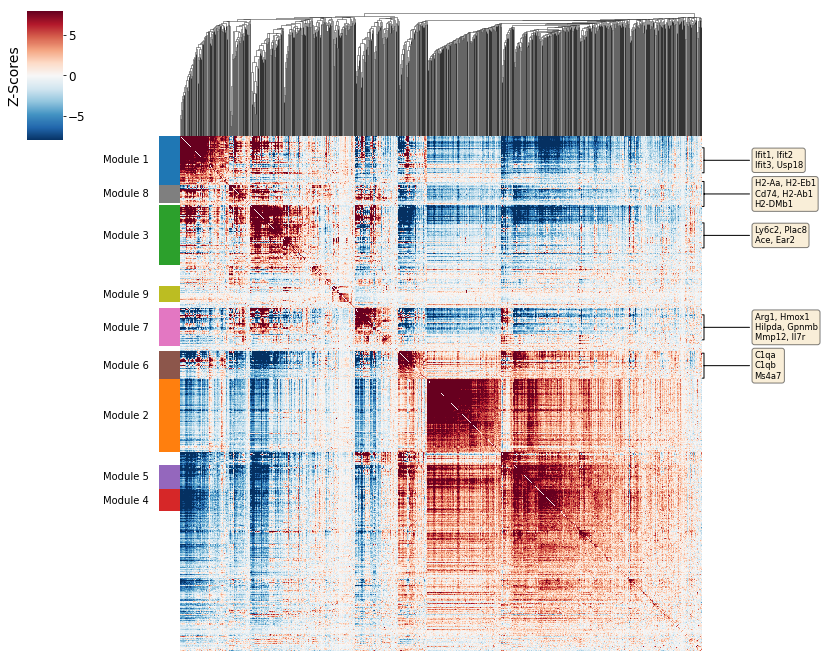

In [252]:
local_correlation_plot(
                    hs.local_correlation_z, hs.modules, hs.linkage,
                    mod_cmap='tab10', vmin=-8, vmax=8,
                    z_cmap='RdBu_r', 
                    gene_modules={
                        8: ["H2-Aa, H2-Eb1", "Cd74, H2-Ab1", "H2-DMb1"],
                        1: ["Ifit1, Ifit2", "Ifit3, Usp18"],
                        3: ["Ly6c2, Plac8", "Ace, Ear2"],
                        7:["Arg1, Hmox1", "Hilpda, Gpnmb", "Mmp12, Il7r"],
                        6: ["C1qa", "C1qb", "Ms4a7"]
                    }
        )

In [989]:
module_scores = hs.calculate_module_scores()

  0%|          | 0/5 [00:00<?, ?it/s]

Computing scores for 5 modules...


100%|██████████| 5/5 [00:01<00:00,  2.74it/s]


In [690]:
import umap
dim_red = umap.UMAP(n_neighbors=30)
slice_data = sc_adata[sc_adata.obs["broad_labels"] == "Mon-Mac"]
result = dim_red.fit_transform(slice_data.obsm["X_scVI"])

/home/ubuntu/anaconda3/envs/scVI/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


NameError: name 'module_scores' is not defined

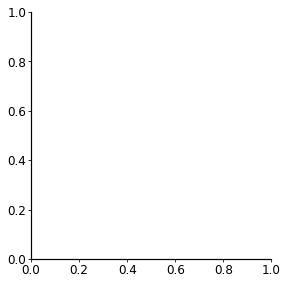

In [84]:
plt.figure(figsize=(25, 10))
plt.title("Hotspot Module for Mon-Mac")
for i in range(9):
    plt.subplot(2, 5, 1 + i)
    plt.scatter(result[:, 0], result[:, 1], c=module_scores.values[:, i], cmap="magma_r")
    plt.grid(False)
    plt.xlabel("UMAP1")
    plt.ylabel("UMAP2")
    plt.title(f"Module {i+1}")
    plt.colorbar()

plt.tight_layout()

In [691]:
import umap
dim_red = umap.UMAP(n_neighbors=30)
result = dim_red.fit_transform(sc_adata_slice.obsm["X_scVI"])

In [821]:
name_ct = "Mon-Mac"
# get data
filter_ = st_adata.obsm["proportions"][name_ct].values > ct_thresholds[name_ct][0]
locations = st_adata.obsm["location"][filter_]
proportions = st_adata.obsm["proportions"][name_ct].values[filter_]

# impute
imp_ge = st_model.get_scale_for_ct(name_ct, indices=np.where(filter_)[0]).values

In [822]:
np.sum(filter_), sc_adata[sc_adata.obs["broad_labels"] == "Mon-Mac"].shape

(3906, (4400, 2886))

/home/ubuntu/anaconda3/envs/scVI/lib/python3.7/site-packages/ipykernel/__main__.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


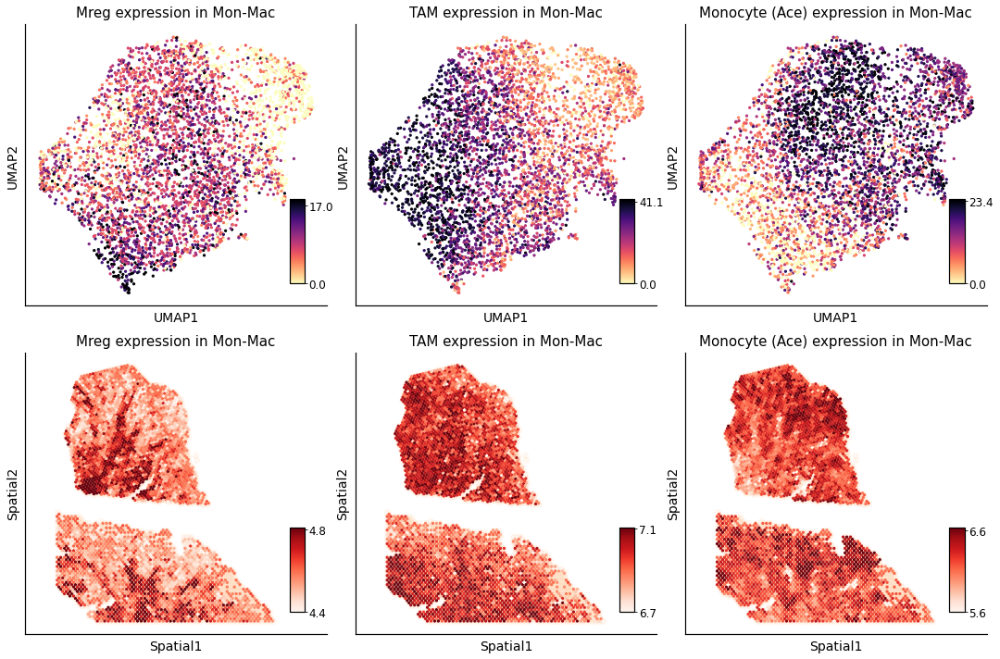

In [717]:
plt.figure(figsize=(15, 10))
names = ["Mreg", "TAM", "Monocyte (Ace)"]
for i, gene_name in enumerate([gene_hypox, gene_ctam, gene_mono]):
    gene_idx = np.where([x in gene_name for x in st_adata.var.index])[0]

    # top plot
    ax1 = plt.subplot(2, 3, 1 + i)
    vector = np.sum(slice_data.X.A[:, gene_idx], axis=1)
    vmax = np.quantile(vector, 0.95)
    sc_plot = plt.scatter(result[:, 0], result[:, 1], c=vector, s=5, cmap="magma_r", vmax=vmax)
    plt.xlabel("UMAP1")
    plt.ylabel("UMAP2")
    plt.title(f"{names[i]} expression in Mon-Mac")
    plt.xticks([])
    plt.yticks([])
    a, b = np.quantile(vector, 0.01),np.quantile(vector, 0.93)
    ta, tb = ["{:0.1f}".format(x) for x in (a, b)]
    cax = inset_axes(plt.gca(), width="5%", height="30%", loc=4, borderpad=2) 
    cbar = plt.colorbar(sc_plot, cax=cax, orientation="vertical")
    cbar.set_ticks([a, b])
    cbar.set_ticklabels([ta, tb])
    # bottom plot
    ax1 = plt.subplot(2, 3, 1 + i+3)
    imp_module = np.sum(imp_ge[:, gene_idx], 1)
    imp_module = np.log(1 + 1e5 * imp_module)
    vmax = np.quantile(imp_module, 0.94)
    vmin = np.quantile(imp_module, 0.01)
    # plot
    plt.scatter([-10, 140], [0, 0], s=0)
    plt.scatter(st_adata.obsm["location"][:, 0], st_adata.obsm["location"][:, 1], alpha=0.05)
    st_plot = plt.scatter(locations[:, 0], locations[:, 1], 
                c=imp_module, s=5, cmap="Reds", vmax=vmax, vmin=vmin)
    plt.xlabel("Spatial1")
    plt.ylabel("Spatial2")
    plt.title(f"{names[i]} expression in Mon-Mac")
    plt.xticks([])
    plt.yticks([])
    a, b = np.quantile(imp_module, 0.01), np.quantile(imp_module, 0.93)
    ta, tb = ["{:0.1f}".format(x) for x in (a, b)]
    cax = inset_axes(plt.gca(), width="5%", height="30%", loc=4, borderpad=2) 
    cbar = plt.colorbar(st_plot, cax=cax, orientation="vertical")
    cbar.set_ticks([a, b])
    cbar.set_ticklabels([ta, tb])
    
plt.tight_layout()
plt.savefig("figures/Mac_gene_expression.pdf")

/home/ubuntu/anaconda3/envs/scVI/lib/python3.7/site-packages/ipykernel/__main__.py:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


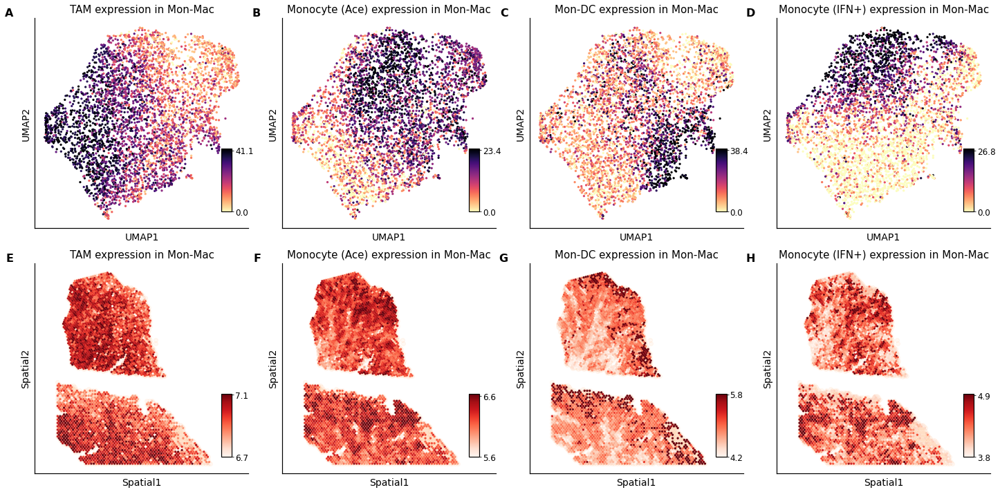

In [718]:
plt.figure(figsize=(20, 10))
names = ["TAM", "Monocyte (Ace)", "Mon-DC", "Monocyte (IFN+)"]
panel_name=[["A", "B", "C", "D"], ["E", "F", "G", "H"]]
for i, gene_name in enumerate([gene_ctam, gene_mono, gene_mhc, gene_ifn]):
    gene_idx = np.where([x in gene_name for x in st_adata.var.index])[0]

    # top plot
    ax1 = plt.subplot(2, 4, 1 + i)
    ax1.text(-0.1, 1.05, panel_name[0][i], transform=ax1.transAxes,
      fontsize=16, fontweight='bold', va='top', ha='right')
    vector = np.sum(slice_data.X.A[:, gene_idx], axis=1)
    vmax = np.quantile(vector, 0.95)
    sc_plot = plt.scatter(result[:, 0], result[:, 1], c=vector, s=5, cmap="magma_r", vmax=vmax)
    plt.xlabel("UMAP1")
    plt.ylabel("UMAP2")
    plt.title(f"{names[i]} expression in Mon-Mac")
    plt.xticks([])
    plt.yticks([])
    a, b = np.quantile(vector, 0.01),np.quantile(vector, 0.93)
    ta, tb = ["{:0.1f}".format(x) for x in (a, b)]
    cax = inset_axes(plt.gca(), width="5%", height="30%", loc=4, borderpad=2) 
    cbar = plt.colorbar(sc_plot, cax=cax, orientation="vertical")
    cbar.set_ticks([a, b])
    cbar.set_ticklabels([ta, tb])
    # bottom plot
    ax1 = plt.subplot(2, 4, 1 + i+4)
    ax1.text(-0.1, 1.05, panel_name[1][i], transform=ax1.transAxes,
      fontsize=16, fontweight='bold', va='top', ha='right')
    imp_module = np.sum(imp_ge[:, gene_idx], 1)
    imp_module = np.log(1 + 1e5 * imp_module)
    vmax = np.quantile(imp_module, 0.94)
    vmin = np.quantile(imp_module, 0.01)
    # plot
    plt.scatter([-10, 140], [0, 0], s=0)
    plt.scatter(st_adata.obsm["location"][:, 0], st_adata.obsm["location"][:, 1], alpha=0.05)
    st_plot = plt.scatter(locations[:, 0], locations[:, 1], 
                c=imp_module, s=5, cmap="Reds", vmax=vmax, vmin=vmin)
    plt.xlabel("Spatial1")
    plt.ylabel("Spatial2")
    plt.title(f"{names[i]} expression in Mon-Mac")
    plt.xticks([])
    plt.yticks([])
    a, b = np.quantile(imp_module, 0.01), np.quantile(imp_module, 0.93)
    ta, tb = ["{:0.1f}".format(x) for x in (a, b)]
    cax = inset_axes(plt.gca(), width="5%", height="30%", loc=4, borderpad=2) 
    cbar = plt.colorbar(st_plot, cax=cax, orientation="vertical")
    cbar.set_ticks([a, b])
    cbar.set_ticklabels([ta, tb])
    
plt.tight_layout()
plt.savefig("figures/supp_Mac_gene_expression.pdf")

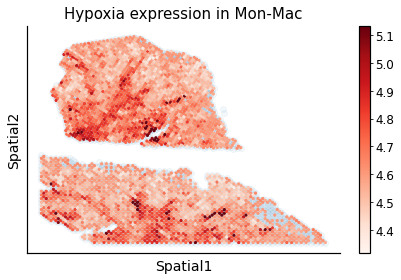

In [719]:
# now let's define an hypoxic zone and perform DE
gene_idx = np.where([x in gene_hypox for x in st_adata.var.index])[0]
imp_module = np.sum(imp_ge[:, gene_idx], 1)
imp_module = np.log(1 + 1e5 * imp_module)
vmax = np.quantile(imp_module, 0.99)
vmin = np.quantile(imp_module, 0.01)
# plot
plt.scatter(st_adata.obsm["location"][:, 0], st_adata.obsm["location"][:, 1], alpha=0.05)
plt.scatter(locations[:, 0], locations[:, 1], 
            c=imp_module, s=5, cmap="Reds", vmax=vmax)
plt.xlabel("Spatial1")
plt.ylabel("Spatial2")
plt.title(f"Hypoxia expression in Mon-Mac")
plt.xticks([])
plt.colorbar()
plt.yticks([])
plt.tight_layout()
plt.show()


### below: further analysis of other cell type proportions, and DE on tumor cells

In [1018]:
barcodes_boundary = pd.read_csv(f"../spatial/barcodes/Slide-1-L1.txt", header=None).values[:, 0]
mask_boundary = np.array([x in barcodes_boundary for x in st_adata.obs.index])[filter_]
mask_tumor = (st_adata.obs["tumor"] == "B1").values[filter_]

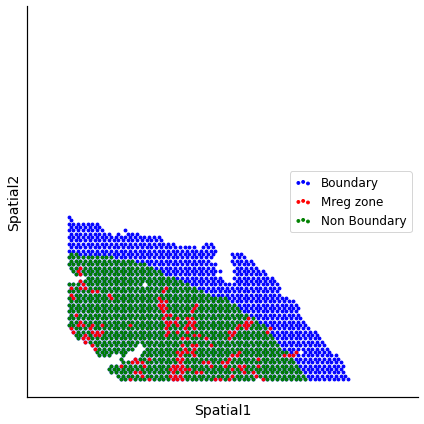

In [1077]:
plt.figure(figsize=(6, 6))
threshold=4.8
mask_hypoxia = imp_module > threshold
mask_A = mask_hypoxia * mask_tumor
mask_B = ~mask_boundary * mask_tumor * ~mask_hypoxia
plt.scatter([-10, 140], [0, 0], s=0)
plt.scatter(st_adata[st_adata.obs["tumor"] == "B1"].obsm["location"][:, 0], st_adata[st_adata.obs["tumor"] == "B1"].obsm["location"][:, 1], label="Boundary", s=8, c="blue")
plt.scatter(locations[mask_A, 0], locations[mask_A, 1], s=8, c="r", vmax=vmax, label="Mreg zone")
plt.scatter(locations[mask_B, 0], locations[mask_B, 1], s=8, c="g", vmax=vmax, label="Non Boundary")
plt.xlabel("Spatial1")
plt.ylabel("Spatial2")
plt.xticks([])
plt.legend(frameon=True)
plt.yticks([])
plt.tight_layout()
plt.show()

In [1024]:
index_hypoxia = st_adata.obs.index[filter_][mask_A]
index_n_hypoxia = st_adata.obs.index[filter_][mask_B] 

In [1058]:
ttest_ind(st_adata.obsm["proportions"].loc[index_hypoxia], st_adata.obsm["proportions"].loc[index_n_hypoxia])

Ttest_indResult(statistic=array([-7.158304 , -7.253365 , -9.091258 ,  9.679316 , -7.341085 ,
       -1.6586407,  2.9229715], dtype=float32), pvalue=array([1.40219639e-12, 7.17949904e-13, 3.82843579e-19, 2.09823149e-21,
       3.84438632e-13, 9.74435776e-02, 3.53061497e-03]))

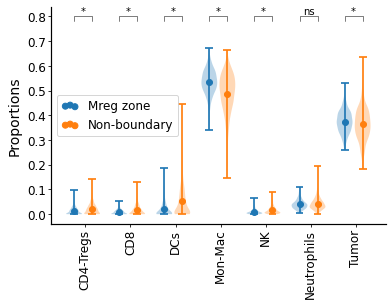

In [1080]:
loc = np.array([0, 1, 2, 3, 4, 5, 6])
plt.violinplot(st_adata.obsm["proportions"].loc[index_hypoxia], positions=loc, widths=0.35)
plt.scatter(loc, st_adata.obsm["proportions"].loc[index_hypoxia].mean(), label="Mreg zone")
plt.violinplot(st_adata.obsm["proportions"].loc[index_n_hypoxia], positions=loc+0.4,widths=0.35)
plt.scatter(loc+0.4, st_adata.obsm["proportions"].loc[index_n_hypoxia].mean(), label="Non-boundary")
plt.xticks(ticks=loc+0.25, labels=st_adata.obsm["proportions"].columns, rotation=90)
plt.ylabel("Proportions")
for l in loc:
    plt.plot([l, l, l+0.4, l+0.4], [0.78, 0.8, 0.8, 0.78], c="black", lw=0.5)
    if l == 5:
        plt.text(l + .2, 0.8, "ns", ha='center', va='bottom')
    else:
        plt.text(l + .2, 0.8, "*", ha='center', va='bottom')
plt.legend()
plt.show()

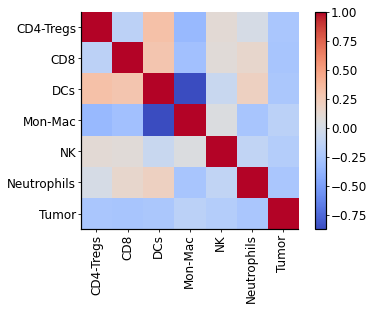

In [764]:
plt.imshow(np.corrcoef(st_adata.obsm["proportions"].values.T), cmap="coolwarm")
plt.colorbar()
plt.xticks(ticks=range(7), labels=st_adata.obsm["proportions"].columns, rotation=90)
plt.yticks(ticks=range(7), labels=st_adata.obsm["proportions"].columns)
plt.show()

In [966]:
# get tumor cells and perform DE
name_ct = "Tumor"
mask_hypoxia = imp_module > 4.65
index_hypoxia = st_adata.obs.index[filter_][mask_hypoxia]
index_n_hypoxia = st_adata.obs.index[filter_][~mask_hypoxia] 

filter_tumor = st_adata.obsm["proportions"][name_ct].values > ct_thresholds[name_ct][0]
index_tumor = st_adata.obs.index[filter_tumor]

In [967]:
index_tumor_hypo = np.intersect1d(index_tumor, index_hypoxia)
index_tumor_n_hypo = np.intersect1d(index_tumor, index_n_hypoxia)

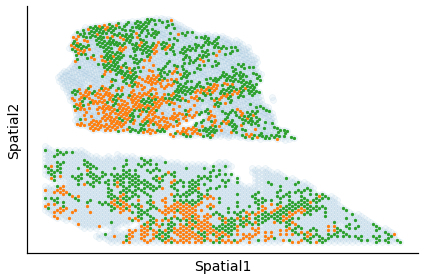

In [968]:
# now let's define an hypoxic zone and perform DE
gene_index = np.where(st_adata.var.index == "Col3a1")[0]
plt.scatter(st_adata.obsm["location"][:, 0], st_adata.obsm["location"][:, 1], alpha=0.05)

plt.scatter(st_adata[index_tumor_hypo].obsm["location"][:, 0], st_adata[index_tumor_hypo].obsm["location"][:, 1], s=5)
plt.scatter(st_adata[index_tumor_n_hypo].obsm["location"][:, 0], st_adata[index_tumor_n_hypo].obsm["location"][:, 1], s=5)


# plot


plt.xlabel("Spatial1")
plt.ylabel("Spatial2")
plt.xticks([])
plt.yticks([])
plt.tight_layout()
plt.show()


In [1059]:
imputations = st_model.get_scale_for_ct("Tumor")
imp_tumor_A = imputations.loc[index_tumor_hypo].values
imp_tumor_B = imputations.loc[index_tumor_n_hypo].values

In [1060]:
# get statistics
avg_library_size = np.mean(np.sum(st_adata.layers["counts"], axis=1).flatten())
exp_px_o = st_model.module.px_o.detach().exp().cpu().numpy()
mean_A = avg_library_size * imp_tumor_A
mean_B = avg_library_size * imp_tumor_B

print(mean_A.shape, mean_B.shape)

# create distribution
concentration_A = torch.tensor(avg_library_size * imp_tumor_A / exp_px_o)
concentration_B = torch.tensor(avg_library_size * imp_tumor_B / exp_px_o)
rate = torch.tensor(1. / exp_px_o)

# generate 
Na, Nb = (3, 1)
simulated_case = Gamma(concentration=concentration_A, rate = rate).sample((Na,)).cpu().numpy()
simulated_case = np.log(simulated_case + 1)
simulated_case = simulated_case.reshape((-1, simulated_case.shape[-1]))

simulated_control = Gamma(concentration=concentration_B, rate = rate).sample((Nb,)).cpu().numpy()
simulated_control = np.log(simulated_control + 1)
simulated_control = simulated_control.reshape((-1, simulated_control.shape[-1]))

(760, 2886) (1212, 2886)


In [1061]:
de = np.array([ks_2samp(simulated_case[:, gene], 
                   simulated_control[:, gene], 
                   alternative='two-sided', mode="asymp").pvalue for gene in range(simulated_control.shape[1])])
lfc = np.log2(1+mean_A).mean(0) - np.log2(1+mean_B).mean(0)
res = pd.DataFrame(data=np.vstack([lfc, -np.log10(de)]), columns=st_adata.var.index, 
                 index=["log2FC", "neglogpval"])

In [978]:
res.to_csv("tumor_DE.csv")

6

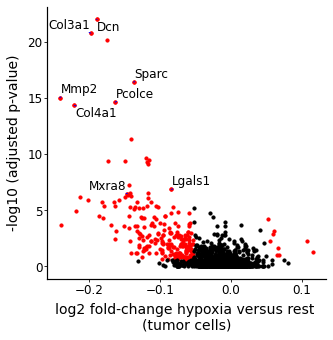

In [1075]:
corr_p_vals = multipletests(de, method='fdr_bh')
max_pval = np.max(corr_p_vals[1][corr_p_vals[0]])
clipped_log_de = np.clip(-np.log10(corr_p_vals[1]), 0, 400)
plt.figure(figsize=(5, 5))
# plot DE genes
mask = (de < max_pval) * (np.abs(lfc) > get_delta(lfc))
de_scatter = plt.scatter(lfc[mask], clipped_log_de[mask], s=10, c="r")
nde_scatter = plt.scatter(lfc[~mask], clipped_log_de[~mask], s=10, c="black")
plt.xlabel("log2 fold-change hypoxia versus rest \n(tumor cells)")
plt.ylabel("-log10 (adjusted p-value)")
# plt.xlim((-2, 2))
# plt.legend((de_scatter, nde_scatter), ("DE genes", "Other genes"), frameon=True)

interesting_genes = ["Mmp2", "Dcn", "Col3a1", "Pcolce", "Col4a1", "Sparc", "Mxra8", "Lgals1"]
                     #"Col3a1", "Bst2"]#"Hilpda", "Cx3cr1", "Mmp12", "Ctsl", "Pf4", "Il7r",
#                      "H2-Aa", "H2-Ab1", "H2-Eb1", "Cxcl9", "Cd74"]
texts = []
for i, gene in enumerate(interesting_genes):
    ind = np.where(st_adata.var.index == gene)[0]
    x_coord, y_coord = lfc[ind], clipped_log_de[ind]
    plt.scatter(x_coord, y_coord, c="r", s=10)
    texts += [plt.text(x_coord, y_coord, gene, fontsize=12)]
adjust_text(texts, lfc, clipped_log_de, arrowprops=dict(arrowstyle="-", color='blue'))
# # plt.title("Hypoxia vs Rest (Mon-Mac only)")
# plt.tight_layout()

In [1072]:
res.iloc[:, np.where(mask)[0]].loc["neglogpval"].nlargest(50)

Dcn         25.484877
Col3a1      23.964531
Bst2        23.212604
Sparc       19.294982
Mmp2        17.820734
Pcolce      17.338178
Col4a1      16.979415
Anxa1       13.962169
Hoxc9       12.160892
Cst6        11.935572
Cav1        11.847622
Colec12     11.756018
Cd63        11.649722
Ltbp4       11.441696
Timp2        9.588385
Lgals1       9.122932
C1s1         8.795920
Col5a2       8.725033
Mxra8        8.664007
Cdkn2a       8.520162
Maged1       8.405796
Prnp         8.352593
Islr         8.314979
Lmna         8.225310
Maged2       8.005181
Wls          7.930264
Emp1         7.820483
Cxcl12       7.804210
Ptges        7.743171
Ddah2        7.731510
Rbp1         7.355878
Apol9a       7.349557
Gas1         7.331873
Loxl1        7.297197
Sdc2         7.243135
Col5a3       7.231218
Nhsl1        7.218057
Msln         7.216804
Casp12       7.064748
Ltbp1        7.017705
Cavin3       6.976360
Ifi44        6.744700
Slc9a3r2     6.686016
Cenpw        6.592756
Nlgn2        6.529938
Cpe       

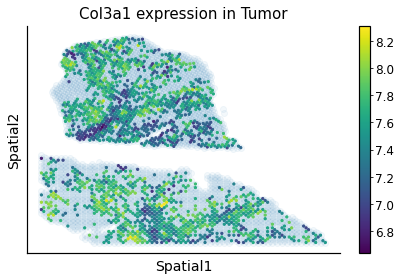

In [982]:
# now let's define an hypoxic zone and perform DE
gene_index = np.where(st_adata.var.index == "Col3a1")[0]
plt.scatter(st_adata.obsm["location"][:, 0], st_adata.obsm["location"][:, 1], alpha=0.05)

vmax = np.log(1+1e5*np.maximum(np.max(imp_tumor_A[:, gene_index]), np.max(imp_tumor_B[:, gene_index])))
vmin = np.log(1+1e5*np.minimum(np.min(imp_tumor_A[:, gene_index]), np.min(imp_tumor_B[:, gene_index])))

plt.scatter(st_adata[index_tumor_hypo].obsm["location"][:, 0], st_adata[index_tumor_hypo].obsm["location"][:, 1], 
            c=np.log(1 + 1e5 * imp_tumor_A)[:, gene_index], s=5,vmin=vmin, vmax=vmax)
plt.scatter(st_adata[index_tumor_n_hypo].obsm["location"][:, 0], st_adata[index_tumor_n_hypo].obsm["location"][:, 1], 
            c=np.log(1 + 1e5 * imp_tumor_B)[:, gene_index], s=5,vmin=vmin, vmax=vmax)

# plot


plt.xlabel("Spatial1")
plt.ylabel("Spatial2")
plt.title(f"{st_adata.var.index[gene_index].values[0]} expression in Tumor")
plt.xticks([])
plt.colorbar()
plt.yticks([])
plt.tight_layout()
plt.show()


In [976]:
res.iloc[:, np.where(mask)[0]].loc["log2FC"].nlargest(20)

Neat1            0.116642
Ncl              0.106919
Lyz2             0.080232
Srm              0.074566
5430416N02Rik    0.067504
Fabp4            0.067214
Ran              0.061122
Hsph1            0.058443
Npm1             0.054792
Ccl7            -0.052709
Agt             -0.052912
Anxa8           -0.053023
Fam189b         -0.053038
Fscn1           -0.053451
Ak1             -0.053548
Dlg5            -0.053653
Pdgfrb          -0.054003
Sspn            -0.054321
Prrx2           -0.054586
Olfml3          -0.054677
Name: log2FC, dtype: float64

In [977]:
res.iloc[:, np.where(mask)[0]].loc["log2FC"].nsmallest(30)

Mmp2      -0.241833
Iigp1     -0.239709
Col4a1    -0.221042
Ifi44     -0.218759
Islr      -0.213595
Maged2    -0.201461
Col3a1    -0.197954
Dcn       -0.189891
Col16a1   -0.186528
Emp1      -0.181812
Apod      -0.181339
Apol9a    -0.179699
Bst2      -0.174636
Colec12   -0.174264
Tns2      -0.169570
Ptges     -0.165777
Cnn3      -0.164341
Rbp1      -0.164308
Pcolce    -0.163446
Ifit3     -0.161712
Wls       -0.158474
Tmem9     -0.151155
Prnp      -0.149681
Cav1      -0.149421
Mxra8     -0.146187
Cdkn2a    -0.145662
Timp2     -0.143630
Scd1      -0.143607
Tpm2      -0.143497
C1s1      -0.142678
Name: log2FC, dtype: float64

### Hotspot of tumor cells

In [76]:
# Step 1, run hotpost and check the modules
# Step 2, check those modules on the single-cell data
# Step 3, do a molecular signature analysis of the hypoxic zone vs the rest

In [983]:
# run hotspot
name_ct = "Tumor"
sc_adata_slice = sc_adata[sc_adata.obs["broad_labels_"] == name_ct]
loc = pd.DataFrame(data=sc_adata_slice.obsm["X_CondSCVI"], index=sc_adata_slice.obs.index)
df = pd.DataFrame(data=sc_adata_slice.X.A.T, columns=sc_adata_slice.obs.index, index=sc_adata_slice.var.index)
# run hotspot
hs = hotspot.Hotspot(df, model='danb', latent=loc,)
hs.create_knn_graph(
        weighted_graph=True, n_neighbors=15,
    )
hs_results = hs.compute_autocorrelations(jobs=1)

 33%|███▎      | 747/2254 [00:00<00:00, 7461.57it/s]


Removing 632 undetected/non-varying genes


100%|██████████| 2254/2254 [00:00<00:00, 9269.31it/s]


In [984]:
hs_genes = hs_results.index[hs_results["FDR"] < 0.05]
hs_genes

Index(['Lgals1', 'Bgn', 'Apod', 'Hsp90ab1', 'Col3a1', 'Rpl8', 'Cst3', 'Ifi44',
       'Hcfc1r1', 'Gnas',
       ...
       'Lclat1', 'Ppid', 'Pla2g12a', 'Sac3d1', 'Pdgfrb', 'Fdps', 'Ghr',
       'Rcan1', 'Msln', 'Tmem176a'],
      dtype='object', name='Gene', length=363)

In [985]:
local_correlations = hs.compute_local_correlations(hs_genes, jobs=4)

100%|██████████| 363/363 [00:00<00:00, 10108.64it/s]

Computing pair-wise local correlation on 363 features...



100%|██████████| 65703/65703 [00:05<00:00, 12073.69it/s]


In [986]:
modules = hs.create_modules(
    min_gene_threshold=30, core_only=True, fdr_threshold=0.5
)

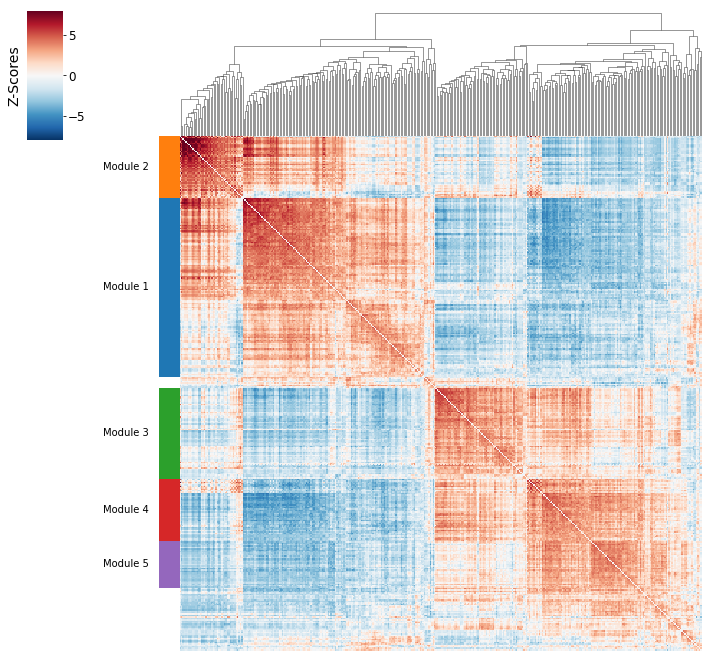

In [987]:
hs.plot_local_correlations()

In [988]:
for module in range(1, 6):
    print(f"Module {module}:")
    gl = list(hs.results.loc[hs.modules.index[np.where(hs.modules == module)[0]]].index[:50])
    print(", ".join(gl) + "\n")
    enr = gseapy.enrichr(gene_list=gl, description='pathway', gene_sets='BioPlanet_2019', outdir='test', no_plot=True)
    print(", ".join(enr.results.head(10)["Term"].values) + "\n")

Module 1:
Apod, Col3a1, Ifi44, Gbp2, Ogn, Ifit1, Ccl8, Ifit3, Col1a1, Col5a2, Ly6a, Ifit3b, Aspn, Ly6c1, Iigp1, Maged2, Mxra8, Cpq, Igtp, Mgp, C1s1, Timp2, Islr, Pcolce, Tmem119, Tmem140, Sdc2, Irgm1, Wls, Phf11d, Tmem176b, Fn1, Fcgrt, Gm4951, Cxcl10, Cnn3, Col5a3, B3gnt9, P3h4, Pdlim2, Gpha2, Samd9l, Fhl2, Usp18, Gas1, S100a16, Col6a1, Mt2, Insl6, Loxl1

ECM-receptor interaction, Extracellular matrix organization, Collagen biosynthesis and modifying enzymes, Beta-1 integrin cell surface interactions, Integrins in angiogenesis, NCAM1 interactions, Syndecan 1 pathway, Amoebiasis, Interferon alpha/beta signaling, Focal adhesion

Module 2:
Lgals1, Bgn, Hsp90ab1, Rpl8, Cst3, Hcfc1r1, Gnas, Bst2, Selenom, Serpinh1, Map1lc3a, Axl, Hint1, Slc25a4, Rpl4, Nexn, Cald1, Gm42418, Spp1, Tubb5, Tceal9, Cd63, Gm26917, Banf1, Igfbp6, Dcn, Slamf9, Hspa5, H13, Sec61a1, Ccl6, Rcn1, Uqcc2, Lsm4, Nedd4, Cnpy2, Bmp1, Npm1, Tspan6, H2afv, Sqstm1, Eif5a, Rpn2, Fdps

T cell receptor regulation of apoptosis, Sm

In [989]:
module_scores = hs.calculate_module_scores()

  0%|          | 0/5 [00:00<?, ?it/s]

Computing scores for 5 modules...


100%|██████████| 5/5 [00:01<00:00,  2.74it/s]


In [990]:
import umap
dim_red = umap.UMAP(n_neighbors=30)
slice_data = sc_adata[sc_adata.obs["broad_labels"] == "Tumor"]
result = dim_red.fit_transform(slice_data.obsm["X_scVI"])

/home/ubuntu/anaconda3/envs/scVI/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


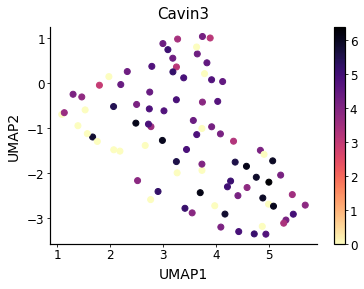

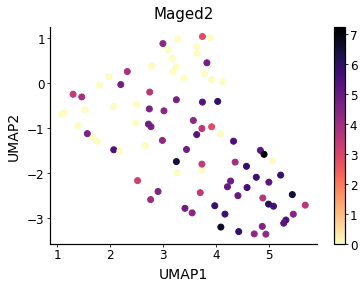

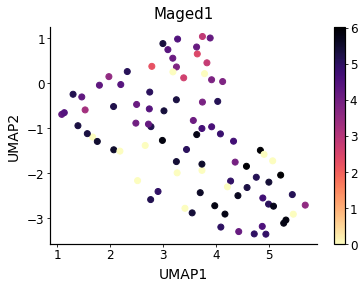

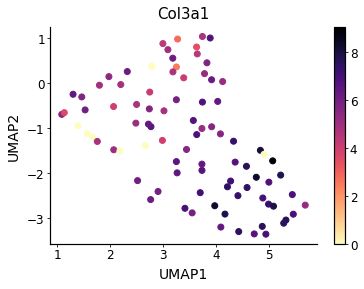

In [1002]:
for gene in ["Cavin3", "Maged2", "Maged1", "Col3a1"]:
    index = np.where(slice_data.var.index == gene)[0][0]
    plt.scatter(result[:, 0], result[:, 1], c=slice_data.X.A[:, index], cmap="magma_r")
    plt.grid(False)
    plt.xlabel("UMAP1")
    plt.ylabel("UMAP2")
    plt.colorbar()
    plt.title(gene)
    plt.show()

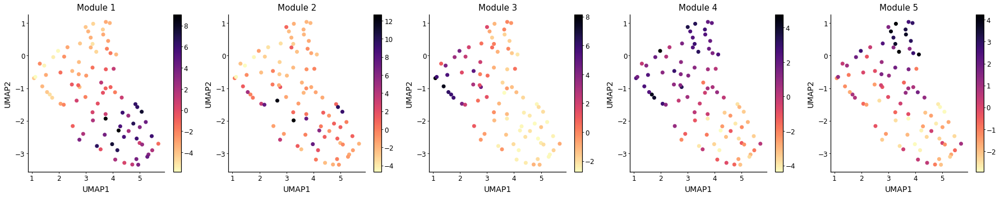

In [1003]:
plt.figure(figsize=(25, 5))
plt.title("Hotspot Module for Tumor")
for i in range(5):
    plt.subplot(1, 5, 1 + i)
    plt.scatter(result[:, 0], result[:, 1], c=module_scores.values[:, i], cmap="magma_r")
    plt.grid(False)
    plt.xlabel("UMAP1")
    plt.ylabel("UMAP2")
    plt.title(f"Module {i+1}")
    plt.colorbar()

plt.tight_layout()

### below: differential expression of macrophages

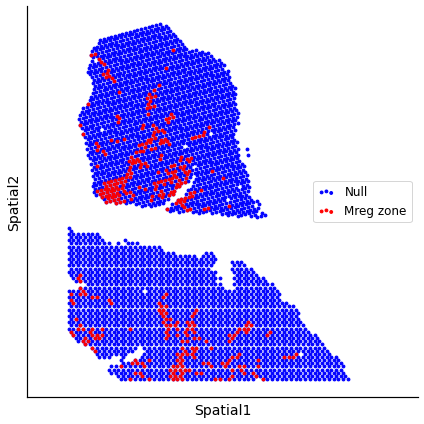

In [1004]:
plt.figure(figsize=(6, 6))
threshold=4.8
mask_hypoxia = imp_module > threshold
plt.scatter([-10, 140], [0, 0], s=0)
plt.scatter(st_adata.obsm["location"][:, 0], st_adata.obsm["location"][:, 1], label="Null", s=8, c="blue")
plt.scatter(locations[mask_hypoxia, 0], locations[mask_hypoxia, 1], s=8, c="r", vmax=vmax, label="Mreg zone")
plt.xlabel("Spatial1")
plt.ylabel("Spatial2")
plt.xticks([])
plt.legend(frameon=True)
plt.yticks([])
plt.tight_layout()
plt.show()

In [117]:
# get statistics
avg_library_size = np.mean(np.sum(st_adata.layers["counts"], axis=1).flatten())
exp_px_o = st_model.module.px_o.detach().exp().cpu().numpy()
mean = avg_library_size * imp_ge

# create distribution
concentration = torch.tensor(avg_library_size * imp_ge / exp_px_o)
rate = torch.tensor(1. / exp_px_o)

mask_non_hypoxia = np.random.choice(np.where(~mask_hypoxia)[0], size=(361))

# slice conditions
print(np.sum(mask_hypoxia), np.sum(mask_non_hypoxia))

# generate 
Na, Nb = (3, 3)
simulated_case = Gamma(concentration=concentration[mask_hypoxia], rate = rate).sample((Na,)).cpu().numpy()
simulated_case = np.log(simulated_case + 1)
simulated_case = simulated_case.reshape((-1, simulated_case.shape[-1]))

simulated_control = Gamma(concentration=concentration[mask_non_hypoxia], rate = rate).sample((Nb,)).cpu().numpy()
simulated_control = np.log(simulated_control + 1)
simulated_control = simulated_control.reshape((-1, simulated_control.shape[-1]))

379 724830


In [124]:
run_DE = True
file_name = "tables/DE_Hypoxia_new.csv"
if run_DE:
    de = np.array([ks_2samp(simulated_case[:, gene], 
                       simulated_control[:, gene], 
                       alternative='two-sided', mode="asymp").pvalue for gene in range(simulated_control.shape[1])])
    lfc = np.log2(mean[mask_hypoxia].mean(0)) - np.log2(mean[mask_non_hypoxia].mean(0))
    pd.DataFrame(data=np.vstack([lfc, -np.log10(de)]), columns=st_adata.var.index, 
                 index=["log2FC", "neglogpval"]).to_csv(file_name)
else:
    info_de = pd.read_csv(file_name, index_col=0)
    lfc, de = info_de.iloc[0].values, np.exp(-info_de.iloc[1]).values

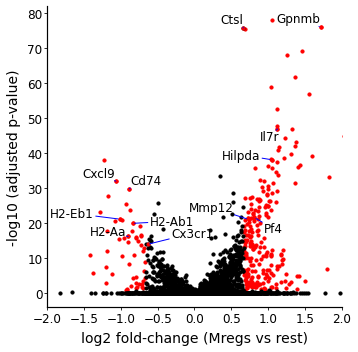

In [127]:
corr_p_vals = multipletests(de, method='fdr_bh')
max_pval = np.max(corr_p_vals[1][corr_p_vals[0]])
lfc = np.log2(mean[mask_hypoxia].mean(0)) - np.log2(mean[mask_non_hypoxia].mean(0))
clipped_log_de = np.clip(-np.log10(corr_p_vals[1]), 0, 400)
plt.figure(figsize=(5, 5))
# plot DE genes
mask = (de < max_pval) * (np.abs(lfc) > get_delta(lfc))
de_scatter = plt.scatter(lfc[mask], clipped_log_de[mask], s=10, c="r")
nde_scatter = plt.scatter(lfc[~mask], clipped_log_de[~mask], s=10, c="black")
plt.xlabel("log2 fold-change (Mregs vs rest)")
plt.ylabel("-log10 (adjusted p-value)")
plt.xlim((-2, 2))
# plt.legend((de_scatter, nde_scatter), ("DE genes", "Other genes"), frameon=True)

interesting_genes = ["Gpnmb", "Hilpda", "Cx3cr1", "Mmp12", "Ctsl", "Pf4", "Il7r",
                     "H2-Aa", "H2-Ab1", "H2-Eb1", "Cxcl9", "Cd74"]
texts = []
for i, gene in enumerate(interesting_genes):
    ind = np.where(st_adata.var.index == gene)[0]
    x_coord, y_coord = lfc[ind], clipped_log_de[ind]
    plt.scatter(x_coord, y_coord, c="r", s=10)
    texts += [plt.text(x_coord, y_coord, gene, fontsize=12)]
adjust_text(texts, lfc, clipped_log_de, arrowprops=dict(arrowstyle="-", color='blue'))
# plt.title("Hypoxia vs Rest (Mon-Mac only)")
plt.tight_layout()
plt.savefig("figures/volcano_Hypoxia.pdf", dpi=DPI)

In [129]:
print("Hypoxia enriched: " + ", ".join(st_adata.var.index[np.where((lfc > get_delta(lfc)) * (de < max_pval ))[0]].values))
print("Null enriched: " + ", ".join(st_adata.var.index[np.where((lfc < -get_delta(lfc)) * (de < max_pval ))[0]].values))

Hypoxia enriched: 1700003F12Rik, 1810021B22Rik, 3110039M20Rik, 4930579C12Rik, 4933407K13Rik, 5430403G16Rik, A530013C23Rik, AA986860, Abca1, Abcb1a, Actg2, Adm, Alms1, Amacr, Ankrd33b, Ankrd55, Apold1, Areg, Arhgap32, Armcx4, Asns, Atad2, B9d1, Bcat1, Bicd1, Brip1, Bub1b, C330013E15Rik, Casc4, Ccne2, Cd200, Cdc42ep1, Cdca7l, Cdh13, Cdr2l, Cela1, Ces1g, Chst1, Clu, Col11a1, Col4a1, Col5a3, Col6a3, Colec12, Coq8a, Crabp2, Cryba4, Cth, Cul7, Cxcl1, Cxcl12, Cyp7b1, Cystm1, Dgat1, Dmwd, Dnah8, Dnmt3l, Dusp14, Dusp4, Ecscr, Ednrb, Efna5, Emp2, Enpp1, Ercc6l, Esco2, Evc2, F730043M19Rik, Fabp5, Fam20a, Fam216a, Fbln2, Fbxo32, Fkbp14, Fosb, Fosl1, Fzd2, Galnt18, Gata2, Gdf11, Gm14167, Gm17066, Gm20632, Gm28557, Gm31105, Gm43254, Gm5129, Gm9828, Gnao1, Gpnmb, Grem1, Gsta4, Hapln4, Hc, Hilpda, Hist1h1d, Hist1h3g, Hist1h4c, Hlf, Hoxa9, Hoxb3, Hsd11b1, Hspb1, Id3, Igf2bp1, Il1r1, Il1rl1, Il7r, Islr, Itgb3, Itih5, Kcne3, Kif20b, Klhl23, Klhl32, Kntc1, L3hypdh, Lamb2, Lgals7, Lhx6, Lif, Lrig1, Mapk12,

In [65]:
print(", ".join(st_adata.var.index[np.where((lfc > 0.5) * (de < np.exp(-150) ))[0]].values))

Abca1, Adam8, Adm, Ager, Arg1, Bnip3, Ccl6, Ccl7, Ccl9, Cd63, Colec12, Csrnp2, Ctsl, Ddah2, Echdc3, Emp1, Etv1, F13a1, Fabp5, Folr2, Fosl1, Galnt18, Gja1, Gpihbp1, Gpnmb, Gstm5, Hilpda, Hist1h2bc, Hmox1, Hoxa9, Ier3, Inhba, Ltbp1, Lzts2, Me1, Mmp12, Ms4a14, Msln, Mt1, Mt2, Mtcl1, Nceh1, Ndrg1, Ninj1, Obsl1, P4ha2, Pacsin3, Pf4, Ppp1r13l, Pyroxd2, Rassf8, Rcn3, Rtkn, S100g, Sdc4, Slc27a3, Snhg12, Snhg18, Sorbs3, Syngr1, Tceal8, Thbs1, Tmem37, Tspan3, Tspan9, Vat1, Vcl, Vldlr, Wwtr1, Ypel2


## validation with imaging

In [664]:
# load barcodes
barcodes = {}
for region in [f"R{i}" for i in (3, 4, 5, 6)]:
    barcodes[region] = pd.read_csv(f"../spatial/barcodes/Slide-1-{region}.txt", header=None).values[:, 0]
for region in [f"L{i}" for i in range(1, 5)]:
    barcodes[region] = pd.read_csv(f"../spatial/barcodes/Slide-1-{region}.txt", header=None).values[:, 0]

,Mon-Mac,DCs,CD8
L1,0.294414,0.229649,0.029151
L2,0.464024,0.070159,0.019242
L3,0.522436,0.026801,0.011052
L4,0.526373,0.034747,0.015418
Tissue,0.449125,0.086611,0.020999


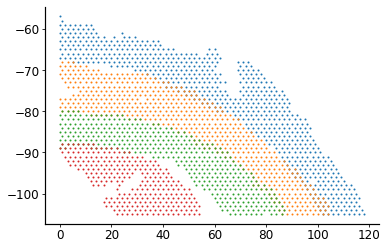

In [665]:
# DC / Macs / T cells / show barcodes
layers_agg_proportions = pd.DataFrame(data=np.zeros(shape=(4, 3)), 
                                      index=[f"L{i}" for i in range(1, 5)], 
                                      columns=["Mon-Mac", "DCs", "CD8"])
for region in layers_agg_proportions.index:
    data = pd.DataFrame(data=st_adata.obsm["location"], index=st_adata.obs.index).loc[barcodes[region]].values
    plt.scatter(data[:, 0], data[:, 1], s=1, label=region)
    for ct in layers_agg_proportions.columns:
        data = st_adata.obsm["proportions"].loc[:, ct]
        layers_agg_proportions.loc[region, ct] = pd.DataFrame(data=data, index=st_adata.obs.index).loc[barcodes[region]].values.mean()

all_prop = st_adata.obsm["proportions"].loc[:, layers_agg_proportions.columns]
layers_agg_proportions.loc["Tissue"] = [np.mean(all_prop.values[:, i]) for i in range(3)]

layers_agg_proportions

## First DCs and Macs

In [666]:
table = pd.read_csv(f"../spatial/imaging info/F480-results.txt", sep="\t")
info = table.loc[:, ["Name", "Num Detections", "Num MHCII: DAPI", "Num F480: DAPI: CD11c"]].sort_values(by="Name")
info

,Name,Num Detections,Num MHCII: DAPI,Num F480: DAPI: CD11c
0,L1,96140,3688,13124
3,L2,64434,528,20665
1,L3,50608,377,15548
5,L4,35490,479,8000
2,PathAnnotationObject,245839,5095,57234
4,Tissue,261072,7509,57407


#### DCs

0.054147006027884234


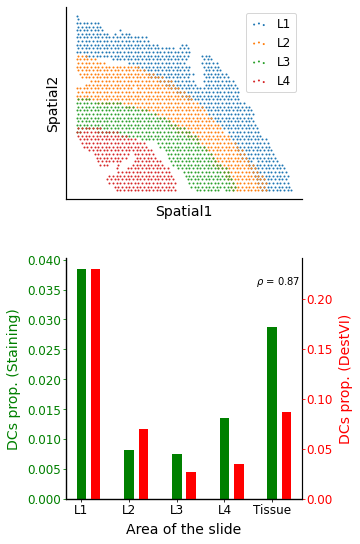

In [670]:
num_areas = 5
xs = np.arange(num_areas)
xts = xs + 0.3
width = 0.2

# get staining values
interest = "Num MHCII: DAPI"
cell_type = "DCs"
total = "Num Detections"
range_interest = [0, 1, 2, 3, 5]
normalized= info.loc[:, interest] / info.loc[:, total]
values_staining = normalized.values[range_interest]
labels = info.loc[:, "Name"].values[range_interest].astype(np.str)

# get proportions values from DestVI
values_analysis = layers_agg_proportions.loc[:, cell_type]

correlation = np.around(pearsonr(values_staining, values_analysis)[0], 2)
print(pearsonr(values_staining, values_analysis)[1])


_, ax = plt.subplots(2, 1, figsize=(5, 8)) 

for region in layers_agg_proportions.index[:-1]:
    data = pd.DataFrame(data=st_adata.obsm["location"], index=st_adata.obs.index).loc[barcodes[region]].values
    ax[0].scatter(data[:, 0], data[:, 1], s=1, label=region)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].legend()
ax[0].set_xlabel("Spatial1")
ax[0].set_ylabel("Spatial2")
ax[0].set_aspect(2)

ax[1].bar(xs, values_staining, width=width, color="green")
ax[1].set_xticks(ticks=xs)
ax[1].set_xticklabels(labels=labels)
ax[1].set_xlabel("Area of the slide")
ax[1].set_ylabel(f"{cell_type} prop. (Staining)")
ax[1].tick_params(axis='y', colors='green')
ax[1].yaxis.label.set_color('green')

axt = ax[1].twinx()
axt.bar(xts, values_analysis, color="red", width=width)
axt.set_xlabel("Area of the slide")
axt.tick_params(axis='y', colors='red')
axt.yaxis.label.set_color('red')

axt.set_ylabel(f"{cell_type} prop. (DestVI)")
ax[1].spines['right'].set_visible(True)

ax[1].text(0.9, 0.9, r"$\rho$ = " + f"{correlation}", ha='center', va='center', transform=ax[1].transAxes)

plt.tight_layout()
plt.savefig("figures/valid_DCs.pdf", dpi=DPI)

### Macs

0.14792169132893854


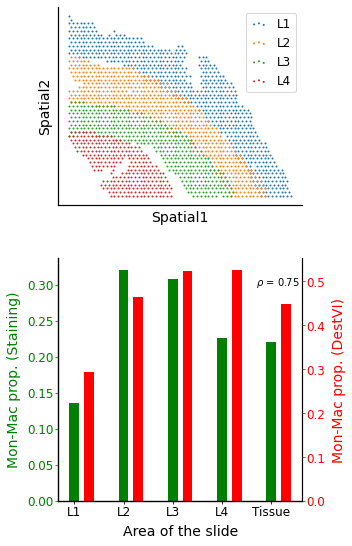

In [671]:
num_areas = 5
xs = np.arange(num_areas)
xts = xs + 0.3
width = 0.2

# get staining values
interest = "Num F480: DAPI: CD11c"
cell_type = "Mon-Mac"
total = "Num Detections"
range_interest = [0, 1, 2, 3, 5]
normalized= info.loc[:, interest] / info.loc[:, total]
values_staining = normalized.values[range_interest]
labels = info.loc[:, "Name"].values[range_interest].astype(np.str)

# get proportions values from DestVI
values_analysis = layers_agg_proportions.loc[:, cell_type]

correlation = np.around(pearsonr(values_staining, values_analysis)[0], 2)
print(pearsonr(values_staining, values_analysis)[1])

_, ax = plt.subplots(2, 1, figsize=(5, 8)) 

for region in layers_agg_proportions.index[:-1]:
    data = pd.DataFrame(data=st_adata.obsm["location"], index=st_adata.obs.index).loc[barcodes[region]].values
    ax[0].scatter(data[:, 0], data[:, 1], s=1, label=region)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].legend()
ax[0].set_xlabel("Spatial1")
ax[0].set_ylabel("Spatial2")
ax[0].set_aspect(2)

ax[1].bar(xs, values_staining, width=width, color="green")
ax[1].set_xticks(ticks=xs)
ax[1].set_xticklabels(labels=labels)
ax[1].set_xlabel("Area of the slide")
ax[1].set_ylabel(f"{cell_type} prop. (Staining)")
ax[1].tick_params(axis='y', colors='green')
ax[1].yaxis.label.set_color('green')

axt = ax[1].twinx()
axt.bar(xts, values_analysis, color="red", width=width)
axt.set_xlabel("Area of the slide")
axt.tick_params(axis='y', colors='red')
axt.yaxis.label.set_color('red')

axt.set_ylabel(f"{cell_type} prop. (DestVI)")
ax[1].spines['right'].set_visible(True)

ax[1].text(0.9, 0.9, r"$\rho$ = " + f"{correlation}", ha='center', va='center', transform=ax[1].transAxes)


plt.tight_layout()
plt.savefig("figures/valid_Mac.pdf", dpi=DPI)

### T cells

In [672]:
table = pd.read_csv(f"../spatial/imaging info/CD31-results.txt", sep="\t")
info = table.loc[:, ["Name", "Num Detections", "Num TCRb"]].sort_values(by="Name")
info

,Name,Num Detections,Num TCRb
1,L1,77714,3355
2,L2,68022,788
3,L3,50849,429
4,L4,66210,312
0,Tissue,275484,5155


0.029462083283753163


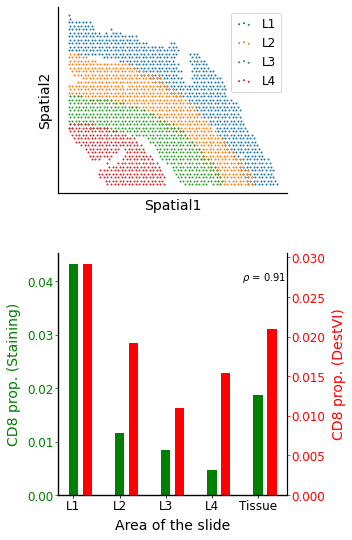

In [673]:
num_areas = 5
xs = np.arange(num_areas)
xts = xs + 0.3
width = 0.2

# get staining values
interest = "Num TCRb"
cell_type = "CD8"
total = "Num Detections"
range_interest = [0, 1, 2, 3, 4]
normalized= info.loc[:, interest] / info.loc[:, total]
values_staining = normalized.values[range_interest]
labels = info.loc[:, "Name"].values[range_interest].astype(np.str)

# get proportions values from DestVI
values_analysis = layers_agg_proportions.loc[:, cell_type]

correlation = np.around(pearsonr(values_staining, values_analysis)[0], 2)
print(pearsonr(values_staining, values_analysis)[1])

_, ax = plt.subplots(2, 1, figsize=(5, 8)) 

for region in layers_agg_proportions.index[:-1]:
    data = pd.DataFrame(data=st_adata.obsm["location"], index=st_adata.obs.index).loc[barcodes[region]].values
    ax[0].scatter(data[:, 0], data[:, 1], s=1, label=region)
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].legend()
ax[0].set_xlabel("Spatial1")
ax[0].set_ylabel("Spatial2")
ax[0].set_aspect(2)

ax[1].bar(xs, values_staining, width=width, color="green")
ax[1].set_xticks(ticks=xs)
ax[1].set_xticklabels(labels=labels)
ax[1].set_xlabel("Area of the slide")
ax[1].set_ylabel(f"{cell_type} prop. (Staining)")
ax[1].tick_params(axis='y', colors='green')
ax[1].yaxis.label.set_color('green')

axt = ax[1].twinx()
axt.bar(xts, values_analysis, color="red", width=width)
axt.set_xlabel("Area of the slide")
axt.tick_params(axis='y', colors='red')
axt.yaxis.label.set_color('red')

axt.set_ylabel(f"{cell_type} prop. (DestVI)")
ax[1].spines['right'].set_visible(True)

ax[1].text(0.9, 0.9, r"$\rho$ = " + f"{correlation}", ha='center', va='center', transform=ax[1].transAxes)


plt.tight_layout()
plt.savefig("figures/valid_Ts.pdf", dpi=DPI)

### NK cells

,NK
R3,0.011319
R4,0.021629
R5,0.010416
R6,0.009614
Tissue,0.013182


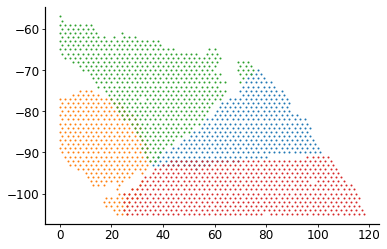

In [676]:
# NK / show barcodes
region_agg_proportions = pd.DataFrame(data=np.zeros(shape=(4, 1)), 
                                      index=[f"R{i}" for i in (3, 4, 5, 6)], 
                                      columns=["NK"])
for region in region_agg_proportions.index:
    data = pd.DataFrame(data=st_adata.obsm["location"], index=st_adata.obs.index).loc[barcodes[region]].values
    plt.scatter(data[:, 0], data[:, 1], s=1, label=region)
    for ct in region_agg_proportions.columns:
        data = st_adata.obsm["proportions"].loc[:, ct]
        region_agg_proportions.loc[region, ct] = pd.DataFrame(data=data, index=st_adata.obs.index).loc[barcodes[region]].values.mean()

all_prop = st_adata.obsm["proportions"].loc[:, region_agg_proportions.columns]
region_agg_proportions.loc["Tissue"] = [np.mean(all_prop.values[:, i]) for i in range(1)]

region_agg_proportions

In [677]:
table = pd.read_csv(f"../spatial/imaging info/NK11-results.txt", sep="\t")
info = table.loc[:, ["Name", "Num Detections", "Num NK1.1: DAPI"]].sort_values(by="Name")
info

,Name,Num Detections,Num NK1.1: DAPI
2,R1,42676,2423
5,R2,14983,1808
1,R3,64735,1442
6,R4,29565,902
3,R5,75960,1340
4,R6,32830,475
0,Tissue,275612,8953


In [678]:
info = info.drop(2)
info = info.drop(5)
info

,Name,Num Detections,Num NK1.1: DAPI
1,R3,64735,1442
6,R4,29565,902
3,R5,75960,1340
4,R6,32830,475
0,Tissue,275612,8953


In [679]:
info.at[0, "Num Detections"] =np.mean(info.values[:, 1][:-1])
info.at[0, "Num NK1.1: DAPI"] =np.mean(info.values[:, 2][:-1])

0.018931020317503638


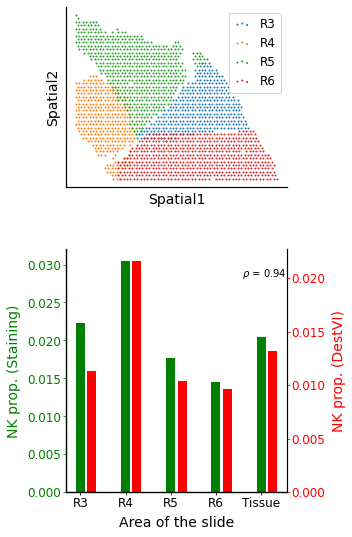

In [681]:
num_areas = 5
xs = np.arange(num_areas)
xts = xs + 0.25
width = 0.2

# get staining values
interest = "Num NK1.1: DAPI"
cell_type = "NK"
total = "Num Detections"
range_interest = [0, 1, 2, 3, 4]
normalized= info.loc[:, interest] / info.loc[:, total]
values_staining = normalized.values[range_interest]
labels = info.loc[:, "Name"].values[range_interest].astype(np.str)

# get proportions values from DestVI
values_analysis = region_agg_proportions.loc[:, cell_type]

correlation = np.around(pearsonr(values_staining, values_analysis)[0], 2)
print(pearsonr(values_staining, values_analysis)[1])

_, ax = plt.subplots(2, 1, figsize=(5, 8)) 

for region in region_agg_proportions.index[:-1]:
    data = pd.DataFrame(data=st_adata.obsm["location"], index=st_adata.obs.index).loc[barcodes[region]].values
    ax[0].scatter(data[:, 0], data[:, 1], s=1, label=region)
    
ax[0].set_xticks([])
ax[0].set_yticks([])
ax[0].legend()
ax[0].set_xlabel("Spatial1")
ax[0].set_ylabel("Spatial2")
ax[0].set_aspect(2)
    
ax[1].bar(xs, values_staining, width=width, color="green")
ax[1].set_xticks(ticks=xs)
ax[1].set_xticklabels(labels=labels)
ax[1].set_xlabel("Area of the slide")
ax[1].set_ylabel(f"{cell_type} prop. (Staining)")
ax[1].tick_params(axis='y', colors='green')
ax[1].yaxis.label.set_color('green')

axt = ax[1].twinx()
axt.bar(xts, values_analysis, color="red", width=width)
axt.set_xlabel("Area of the slide")
axt.tick_params(axis='y', colors='red')
axt.yaxis.label.set_color('red')

axt.set_ylabel(f"{cell_type} prop. (DestVI)")
ax[1].spines['right'].set_visible(True)

ax[1].text(0.9, 0.9, r"$\rho$ = " + f"{correlation}", ha='center', va='center', transform=ax[1].transAxes)


plt.tight_layout()
plt.savefig("figures/valid_NK.pdf", dpi=DPI)